In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


Import dataset

In [6]:
df=pd.read_csv("CUST_INSUR_LTV_APPLY.csv")

In [7]:
df.head()

,MARITAL_STATUS,STATE,CREDIT_BALANCE,TIME_AS_CUSTOMER,MORTGAGE_AMOUNT,BANK_FUNDS,N_OF_DEPENDENTS,HAS_CHILDREN,SALARY,CUST_ID,...,LTV,T_AMOUNT_AUTOM_PAYMENTS,N_TRANS_TELLER,CHECKING_AMOUNT,N_TRANS_ATM,LTV_BIN,LAST,N_MORTGAGES,CAR_OWNERSHIP,FIRST
0,SINGLE,CA,0,3,0,0,3,0,65871,CU15154,...,14367.75,0,0,25,0,MEDIUM,GAYLE,0,0,DURANT
1,SINGLE,NY,0,4,0,290,4,0,68747,CU15155,...,14686.75,287,2,25,4,MEDIUM,QUINTON,0,1,MASSEY
2,MARRIED,MI,0,3,1000,550,3,0,68684,CU15157,...,25271.00,132,2,25,4,HIGH,ANIBAL,1,1,JIMENEZ
3,MARRIED,UT,0,5,1200,1000,5,0,59354,CU15286,...,19738.50,628,3,619,1,MEDIUM,JUNITA,1,1,ROBERTSON
4,MARRIED,UT,0,4,1800,0,3,0,84801,CU15287,...,31900.25,0,0,25,0,VERY HIGH,CHASITY,1,1,ELLIS


In [8]:
df.columns.shape

(31,)

####Drop the Ltv and LTV bin columns

In [9]:
df.drop(columns=(['LTV','LTV_BIN','FIRST','STATE','CUST_ID','LAST']),inplace=True)

In [10]:
print(df.columns.shape)
df.columns

(25,)


Index(['MARITAL_STATUS', 'CREDIT_BALANCE', 'TIME_AS_CUSTOMER',
       'MORTGAGE_AMOUNT', 'BANK_FUNDS', 'N_OF_DEPENDENTS', 'HAS_CHILDREN',
       'SALARY', 'SEX', 'PROFESSION', 'CREDIT_CARD_LIMITS', 'REGION',
       'HOUSE_OWNERSHIP', 'N_TRANS_WEB_BANK', 'BUY_INSURANCE',
       'MONTHLY_CHECKS_WRITTEN', 'N_TRANS_KIOSK', 'AGE',
       'MONEY_MONTLY_OVERDRAWN', 'T_AMOUNT_AUTOM_PAYMENTS', 'N_TRANS_TELLER',
       'CHECKING_AMOUNT', 'N_TRANS_ATM', 'N_MORTGAGES', 'CAR_OWNERSHIP'],
      dtype='object')

In [11]:
#dividing categorical and quantitative features
cats=['MARITAL_STATUS','HAS_CHILDREN','SEX', 'PROFESSION','REGION',
       'HOUSE_OWNERSHIP', 'CAR_OWNERSHIP']
quants=['TIME_AS_CUSTOMER','MORTGAGE_AMOUNT', 'BANK_FUNDS', 'N_OF_DEPENDENTS', 'SALARY',
        'CREDIT_CARD_LIMITS', 'N_TRANS_WEB_BANK', 'MONTHLY_CHECKS_WRITTEN',
       'N_TRANS_KIOSK', 'AGE', 'MONEY_MONTLY_OVERDRAWN','T_AMOUNT_AUTOM_PAYMENTS', 'N_TRANS_TELLER', 'CHECKING_AMOUNT',
       'N_TRANS_ATM', 'N_MORTGAGES','CREDIT_BALANCE']
response=['BUY_INSURANCE']

In [12]:
df.shape

(13880, 25)

## **Preprocessing**

In [13]:
df.duplicated().sum()

np.int64(0)

In [14]:
df.isnull().sum()

MARITAL_STATUS             0
CREDIT_BALANCE             0
TIME_AS_CUSTOMER           0
MORTGAGE_AMOUNT            0
BANK_FUNDS                 0
N_OF_DEPENDENTS            0
HAS_CHILDREN               0
SALARY                     0
SEX                        0
PROFESSION                 0
CREDIT_CARD_LIMITS         0
REGION                     0
HOUSE_OWNERSHIP            0
N_TRANS_WEB_BANK           0
BUY_INSURANCE              0
MONTHLY_CHECKS_WRITTEN     0
N_TRANS_KIOSK              0
AGE                        0
MONEY_MONTLY_OVERDRAWN     0
T_AMOUNT_AUTOM_PAYMENTS    0
N_TRANS_TELLER             0
CHECKING_AMOUNT            0
N_TRANS_ATM                0
N_MORTGAGES                0
CAR_OWNERSHIP              0
dtype: int64

In [15]:
df.dtypes

MARITAL_STATUS              object
CREDIT_BALANCE               int64
TIME_AS_CUSTOMER             int64
MORTGAGE_AMOUNT              int64
BANK_FUNDS                   int64
N_OF_DEPENDENTS              int64
HAS_CHILDREN                 int64
SALARY                       int64
SEX                         object
PROFESSION                  object
CREDIT_CARD_LIMITS           int64
REGION                      object
HOUSE_OWNERSHIP              int64
N_TRANS_WEB_BANK             int64
BUY_INSURANCE               object
MONTHLY_CHECKS_WRITTEN       int64
N_TRANS_KIOSK                int64
AGE                          int64
MONEY_MONTLY_OVERDRAWN     float64
T_AMOUNT_AUTOM_PAYMENTS      int64
N_TRANS_TELLER               int64
CHECKING_AMOUNT              int64
N_TRANS_ATM                  int64
N_MORTGAGES                  int64
CAR_OWNERSHIP                int64
dtype: object

In [16]:
for col in cats:
    df[col] = df[col].astype('object')

In [17]:
df.dtypes

MARITAL_STATUS              object
CREDIT_BALANCE               int64
TIME_AS_CUSTOMER             int64
MORTGAGE_AMOUNT              int64
BANK_FUNDS                   int64
N_OF_DEPENDENTS              int64
HAS_CHILDREN                object
SALARY                       int64
SEX                         object
PROFESSION                  object
CREDIT_CARD_LIMITS           int64
REGION                      object
HOUSE_OWNERSHIP             object
N_TRANS_WEB_BANK             int64
BUY_INSURANCE               object
MONTHLY_CHECKS_WRITTEN       int64
N_TRANS_KIOSK                int64
AGE                          int64
MONEY_MONTLY_OVERDRAWN     float64
T_AMOUNT_AUTOM_PAYMENTS      int64
N_TRANS_TELLER               int64
CHECKING_AMOUNT              int64
N_TRANS_ATM                  int64
N_MORTGAGES                  int64
CAR_OWNERSHIP               object
dtype: object

In [18]:
df.describe(include="O")

,MARITAL_STATUS,HAS_CHILDREN,SEX,PROFESSION,REGION,HOUSE_OWNERSHIP,BUY_INSURANCE,CAR_OWNERSHIP
count,13880,13880,13880,13880,13880,13880,13880,13880
unique,5,2,2,100,5,3,2,2
top,SINGLE,0,M,Programmer/Developer,NorthEast,1,No,1
freq,4856,6940,9462,2221,4948,9667,10127,12926


In [19]:
#Checking unique values in each variables with thier count percentage
for i in cats:
  print(i)
  print(df[i].value_counts(normalize=True))

MARITAL_STATUS
MARITAL_STATUS
SINGLE      0.349856
MARRIED     0.342147
DIVORCED    0.255476
WIDOWED     0.043732
OTHER       0.008790
Name: proportion, dtype: float64
HAS_CHILDREN
HAS_CHILDREN
0    0.5
1    0.5
Name: proportion, dtype: float64
SEX
SEX
M    0.6817
F    0.3183
Name: proportion, dtype: float64
PROFESSION
PROFESSION
Programmer/Developer    0.160014
IT Staff                0.078386
Clerical                0.040778
Nurse                   0.040130
Not specified           0.031124
                          ...   
PROF-61                 0.001225
PROF-64                 0.001153
PROF-65                 0.001153
PROF-67                 0.001081
PROF-66                 0.001009
Name: proportion, Length: 100, dtype: float64
REGION
REGION
NorthEast    0.356484
West         0.283141
Midwest      0.217435
South        0.075432
Southwest    0.067507
Name: proportion, dtype: float64
HOUSE_OWNERSHIP
HOUSE_OWNERSHIP
1    0.696470
0    0.249207
2    0.054323
Name: proportion, dtype: flo

In [20]:
#profession has lots of numbers of categories, lower amount catgories encoded to others
#catogories of occurance less tha 400 humdrand in PROFESSION column recode as other
categories_to_recode = df['PROFESSION'].value_counts()[df['PROFESSION'].value_counts() < 400].index
df['PROFESSION'] = df['PROFESSION'].replace(categories_to_recode, 'Other')
df['PROFESSION'].value_counts()

PROFESSION
Other                       7341
Programmer/Developer        2221
IT Staff                    1088
Clerical                     566
Nurse                        557
Not specified                432
Author                       421
Cashier                      421
Waiter/Waitress              419
Administrative Assistant     414
Name: count, dtype: int64

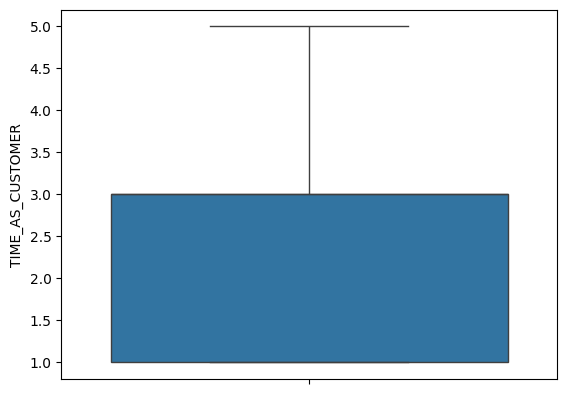

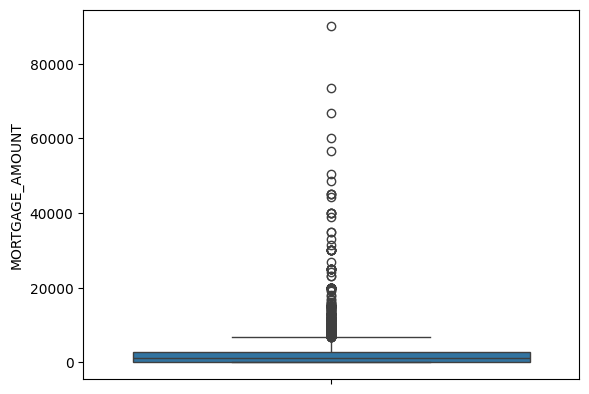

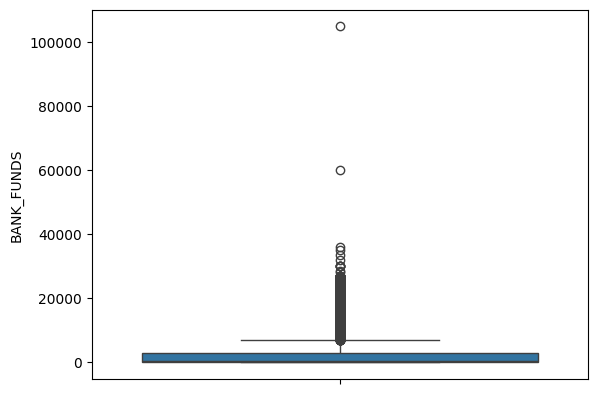

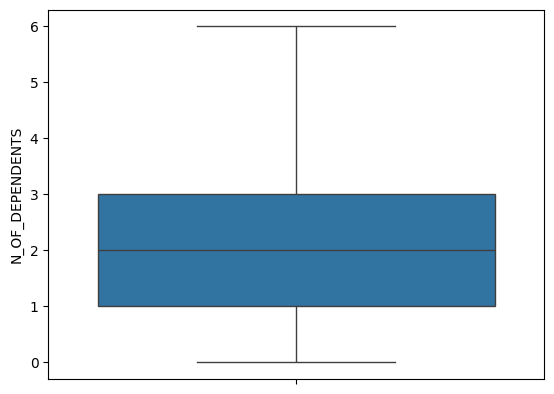

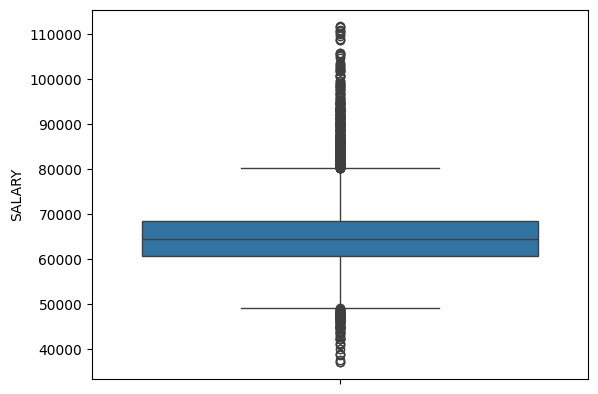

...

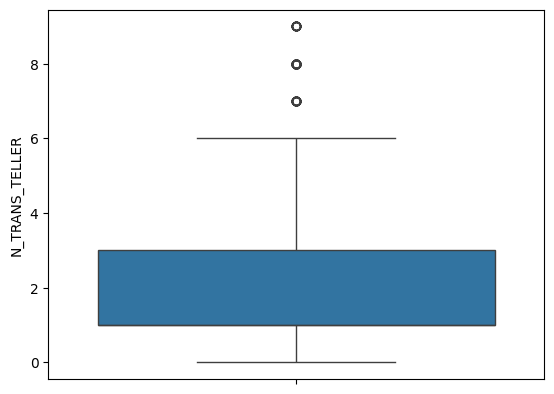

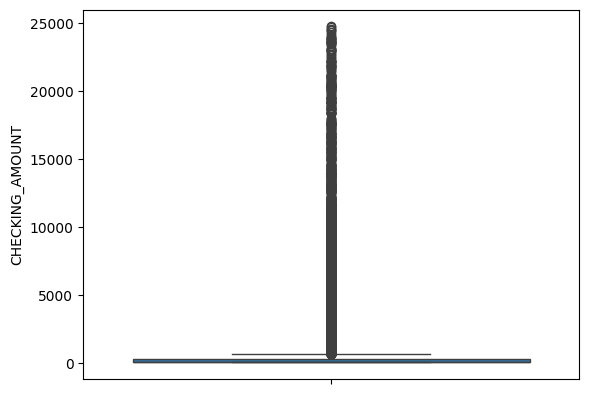

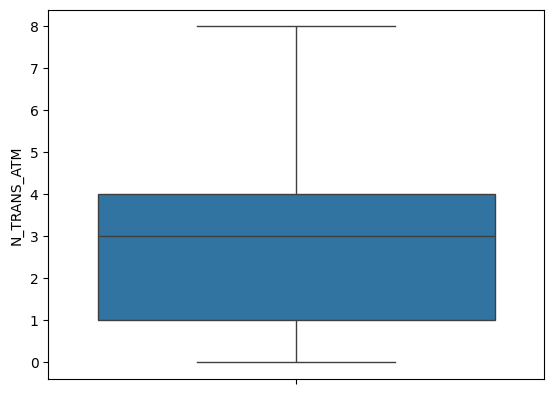

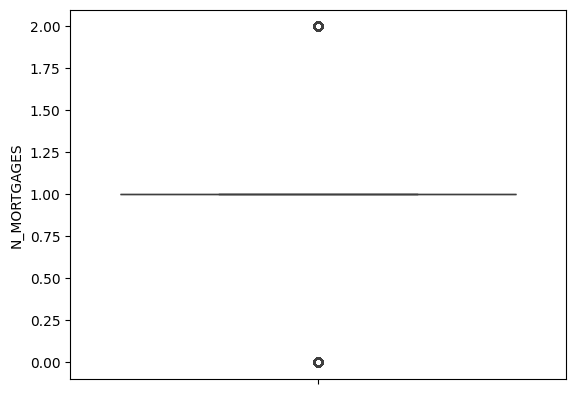

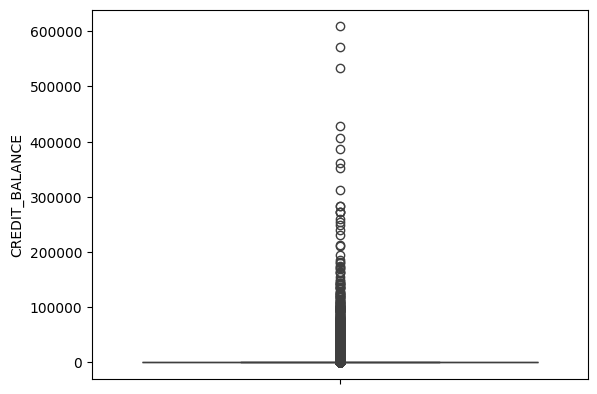

In [21]:
#plotting individual box plot on categorical variables to initial checkinh of outliers
for i in quants:
  sns.boxplot(df[i])
  plt.show()

## Multivariate Outlier detection for Mix Data

In [22]:
#Create copy of df without the outcome variable
df_copy=df.copy()
df_copy=df_copy.drop(['BUY_INSURANCE'], axis=1)

In [23]:
df_copy.shape

(13880, 24)

In [153]:
import gower

# Calculate the Gower distance matrix
gower_dist = gower.gower_matrix(df_copy)

# k= No.of dimensions * 2
k = 48


In [156]:
from sklearn.neighbors import NearestNeighbors
# Use NearestNeighbors with precomputed distance
neighbors = NearestNeighbors(n_neighbors=k, metric='precomputed')
neighbors_fit = neighbors.fit(gower_dist)
distances, indices = neighbors_fit.kneighbors(gower_dist)

# Sort distances to the k-th nearest neighbor
distances = np.sort(distances[:, k-1], axis=0)

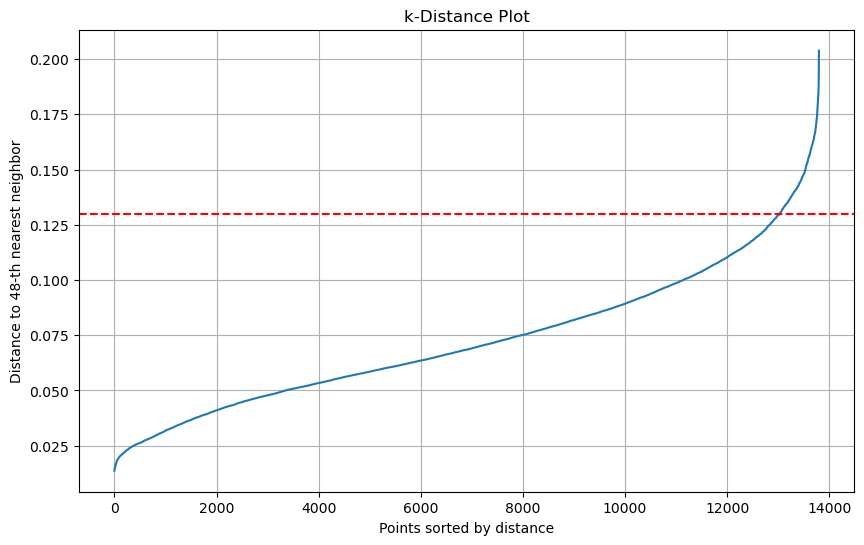

In [157]:
# Plot the k-distance graph
plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('k-Distance Plot')
plt.xlabel('Points sorted by distance')
plt.ylabel('Distance to {}-th nearest neighbor'.format(k))
plt.axhline(y=0.13, color='r', linestyle='--')  # Add a horizontal line at the chosen epsilon
plt.grid(True)
plt.show()

eps= 0.13 , min_samples= No. of dimensions * 2

In [161]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.13, min_samples=48,metric='precomputed')
dbscan.fit(gower_dist)

DBSCAN(eps=0.13, metric='precomputed', min_samples=48)

In [163]:
labels = dbscan.labels_
num_outliers = np.sum(labels == -1)

print("Number of outliers detected:", num_outliers)

Number of outliers detected: 13


In [165]:
print("Percentage of outliers:", np.sum(labels == -1) / len(labels) * 100)

Percentage of outliers: 0.09422338189461477


Less than 1% of data detected as outlier so remove them

In [168]:
noise_indexes = df[labels == -1].index.tolist()

In [170]:
noise_indexes

[1803, 1814, 2080, 3209, 3249, 4501, 4525, 5067, 5088, 6369, 8521, 9423, 13320]

In [29]:

a=[51, 344, 426, 428, 513, 540, 713, 859, 947, 1256, 1556, 1621, 1622, 1639, 1802, 1807, 1940, 1980, 2241, 2415, 2519, 2746, 2749, 2805, 2910, 3359, 3495, 3686, 4097, 4279, 4321, 4365,
4404, 4467, 5177, 5386, 5478, 5484, 5537, 5607, 5712, 5750, 5925, 5944, 6002, 6045, 6074, 6232, 6310, 6332, 6678, 6706, 6731, 7026, 7114, 7185, 7888, 7898, 7930, 8418, 8497, 8602, 8729,
8951, 9102, 9433, 9443, 9450, 9453, 9458, 9488, 9550, 10609, 10758, 11409, 11625, 11626, 12036, 12466, 13287, 13323, 13360, 13777]


In [363]:
#removing noicy data from the system
# Remove outliers from the dataframe
df = df.drop(df[labels == -1].index)

ValueError: Item wrong length 13797 instead of 13880.

In [30]:
# remove rows of df with index in equals to list a
existing_indices = [i for i in a if i in df.index]
df = df.drop(existing_indices)


In [31]:
df.shape

(13797, 25)

## Train test split

In [32]:
#split data train and test

from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X = df.drop('BUY_INSURANCE', axis=1)
y = df['BUY_INSURANCE']
#y=y.map({'Yes':1,'No':0})
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100)


In [33]:

import pandas as pd
# Create a new dataframe with X_train and y_train
train_df = pd.concat([X_train, y_train], axis=1)


In [34]:
train_df.shape

(11037, 25)

In [35]:
#train_df.to_csv('train.csv',index=False)

## EDA

### Univariate

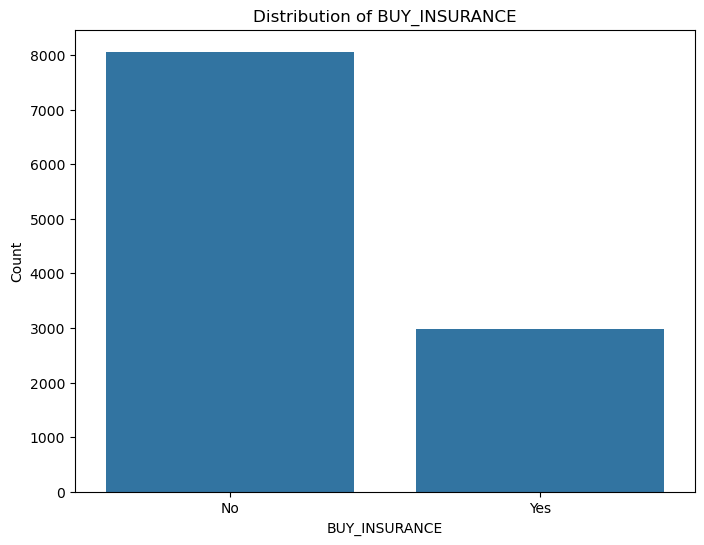

In [25]:
plt.figure(figsize=(8, 6))
sns.countplot(x='BUY_INSURANCE', data=train_df)
plt.title('Distribution of BUY_INSURANCE')
plt.xlabel('BUY_INSURANCE')
plt.ylabel('Count')
plt.show()


There is class imbalance.

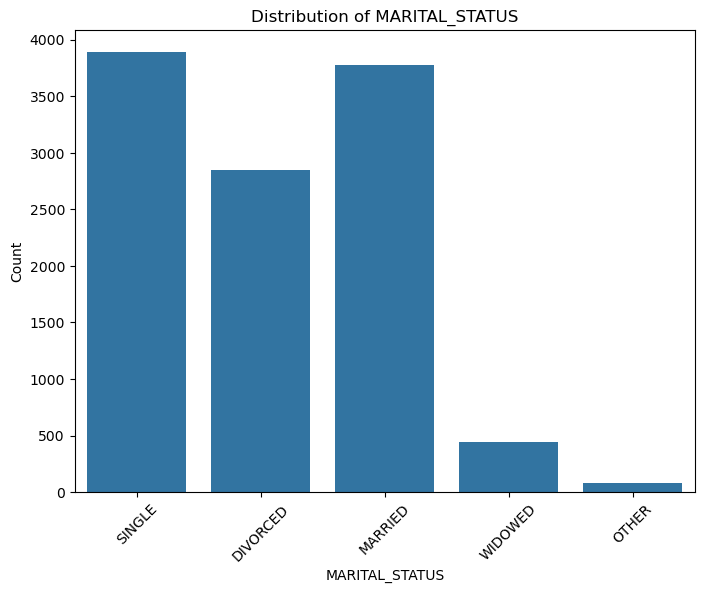

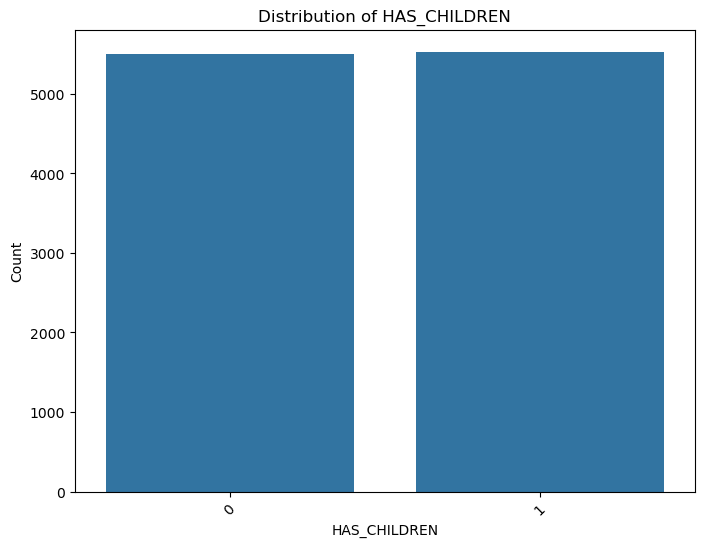

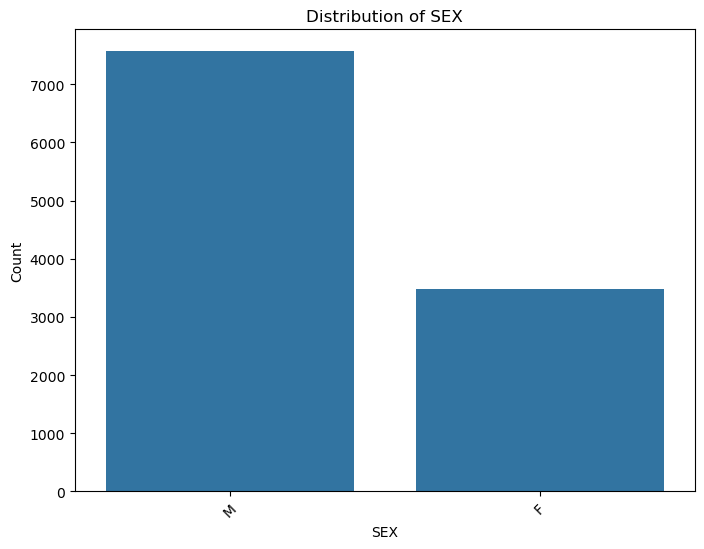

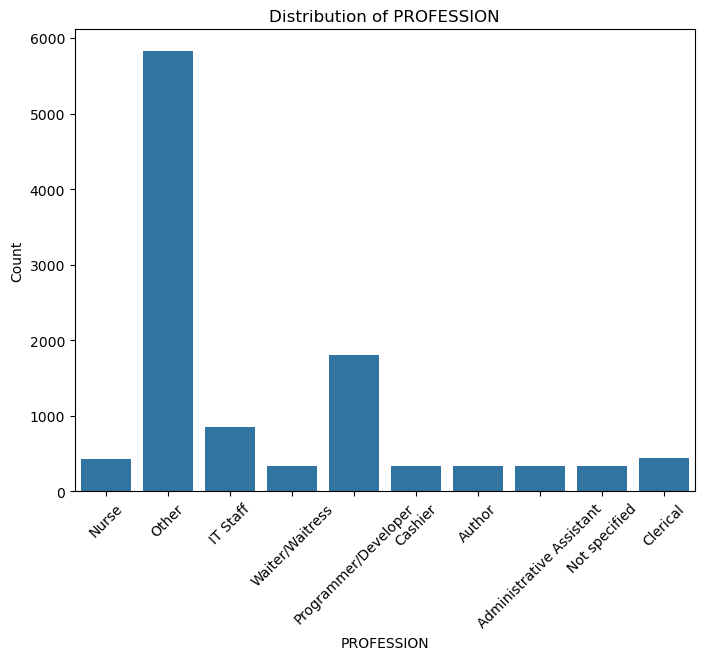

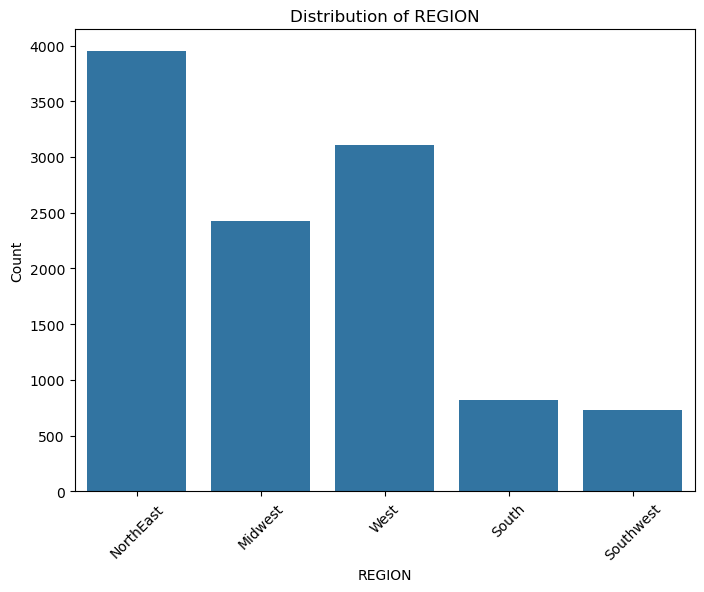

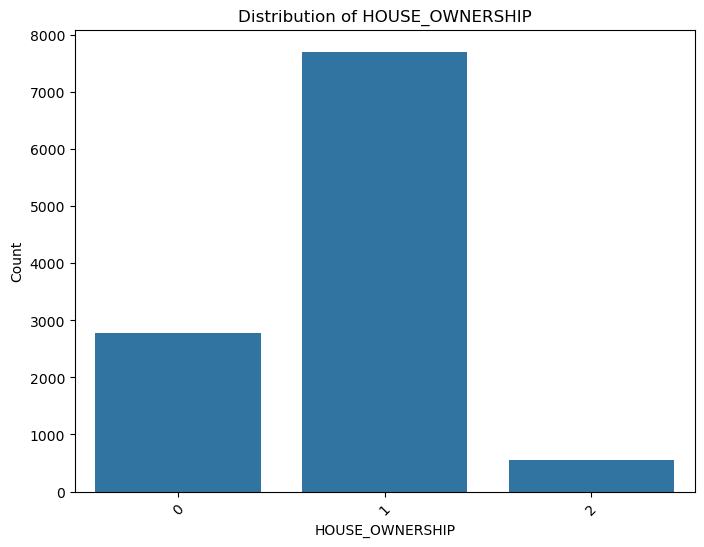

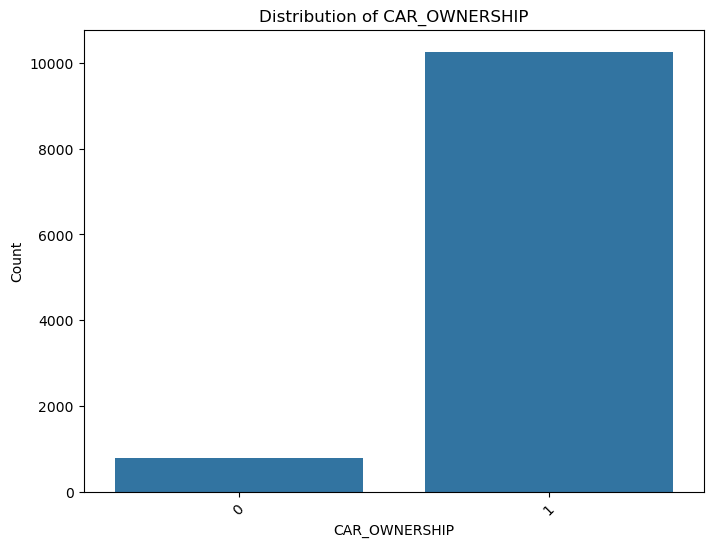

In [26]:
cats=['MARITAL_STATUS','HAS_CHILDREN','SEX', 'PROFESSION','REGION',
       'HOUSE_OWNERSHIP', 'CAR_OWNERSHIP']

for i in cats:
  plt.figure(figsize=(8, 6))
  sns.countplot(x=i, data=train_df)
  plt.title('Distribution of '+i)
  plt.xlabel(i)
  plt.ylabel('Count')
  plt.xticks(rotation=45)
  plt.show()

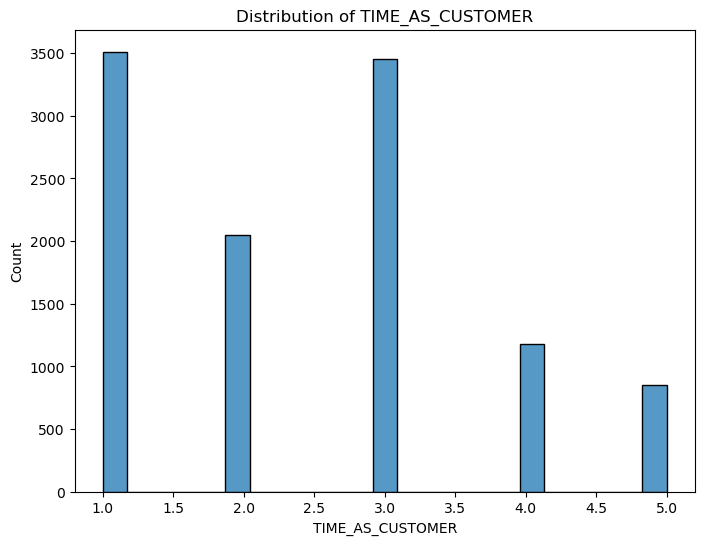

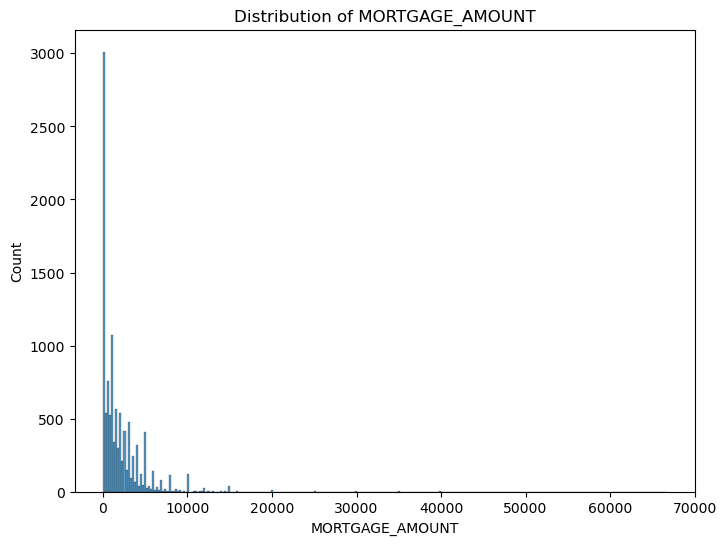

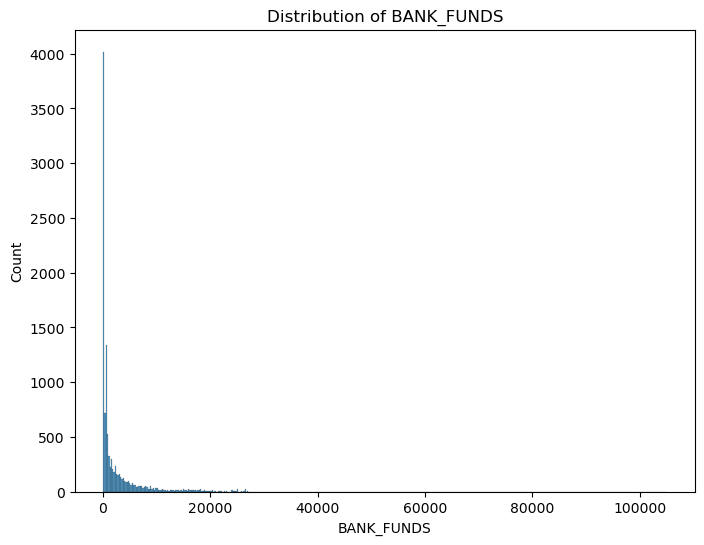

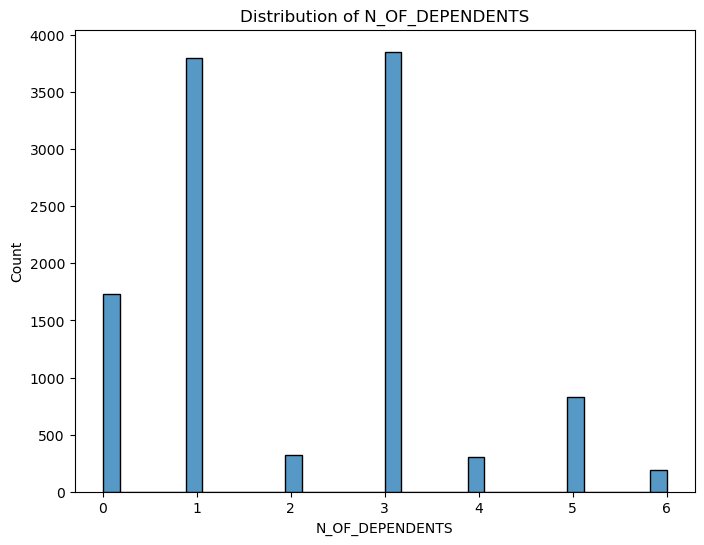

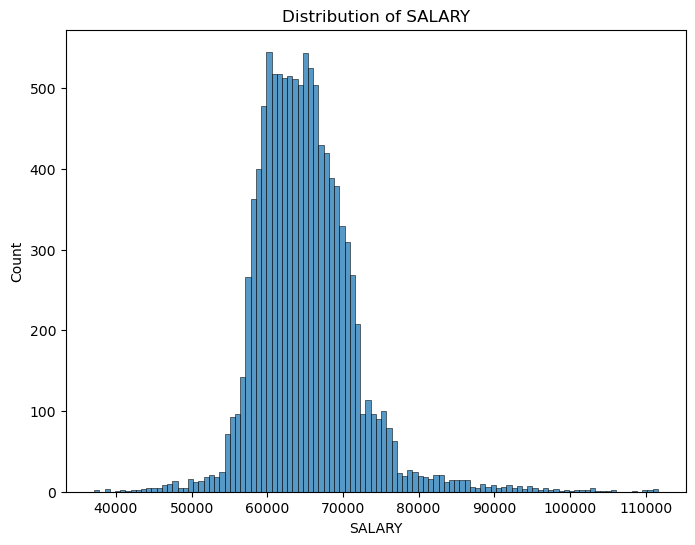

...

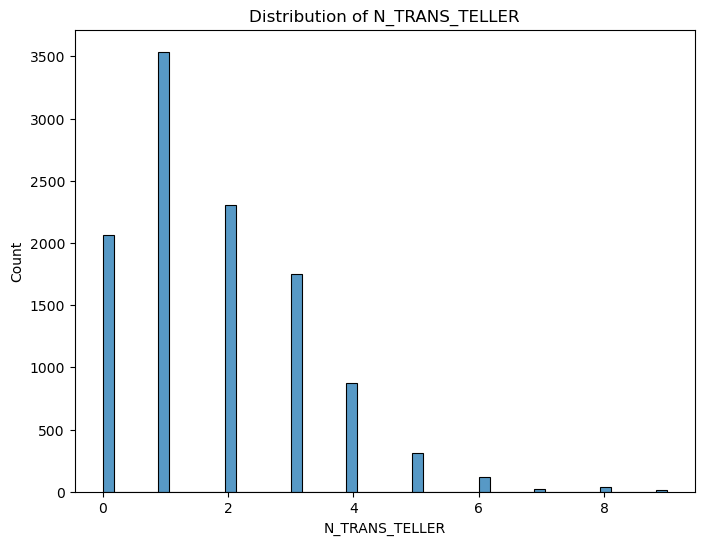

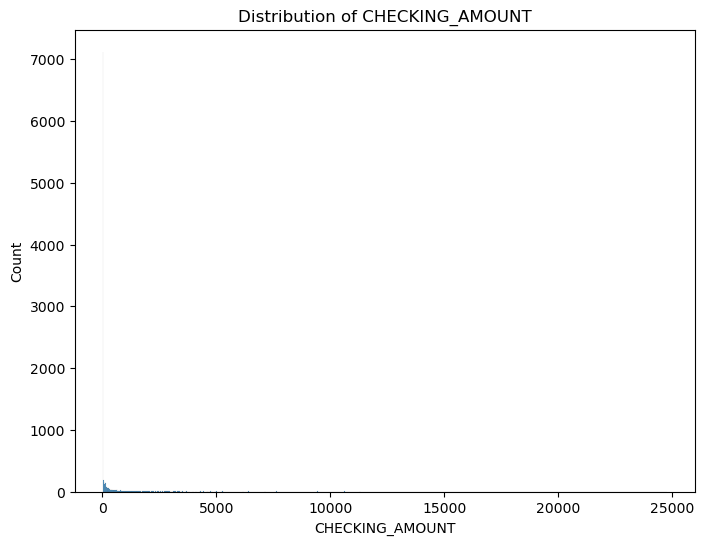

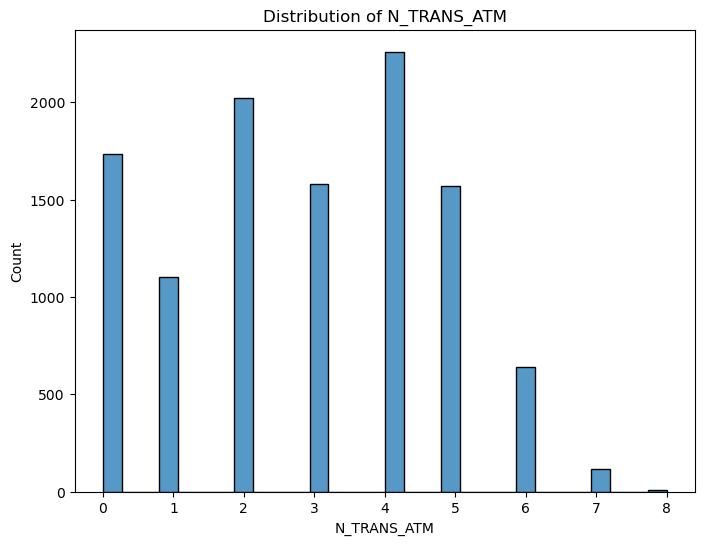

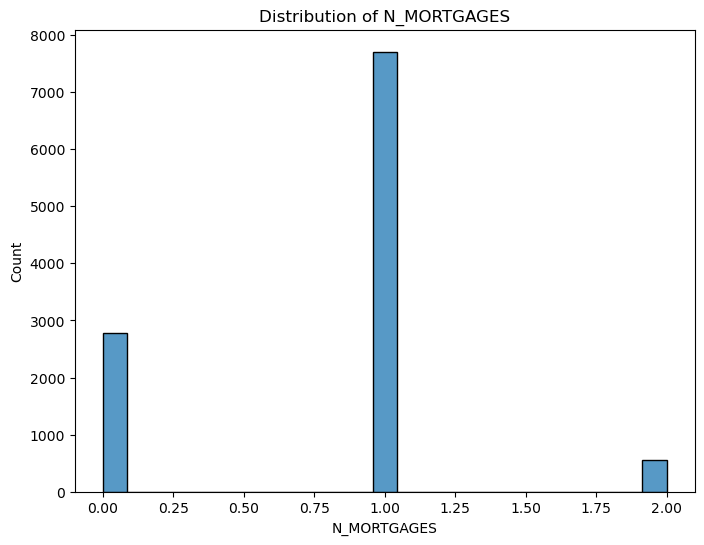

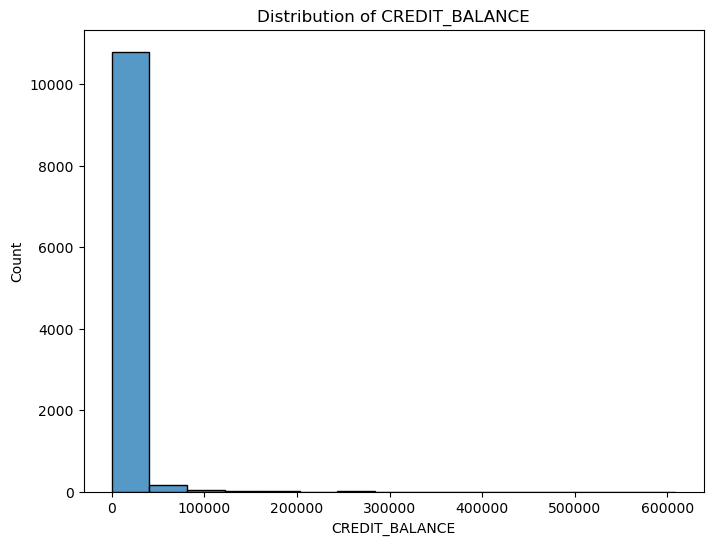

In [27]:
for i in quants:
  plt.figure(figsize=(8, 6))
  sns.histplot(x=i, data=train_df)
  plt.title('Distribution of '+i)

In [28]:
import plotly.express as px
import plotly.subplots as sp


num_features = len(quants)
grid_size = 4  
rows = (num_features // grid_size) + (1 if num_features % grid_size != 0 else 0)


fig = sp.make_subplots(rows=rows, cols=grid_size, subplot_titles=quants)

for i, feature in enumerate(quants):
    row = i // grid_size + 1
    col = i % grid_size + 1
    
    
    box_plot = px.box(train_df, x='BUY_INSURANCE', y=feature, points=False, #this can be adjusted for outliers
                      labels={'BUY_INSURANCE': 'Buy Insurance', feature: feature},
                      title=f'{feature} vs BUY_INSURANCE')
    
    
    for trace in box_plot.data:
        fig.add_trace(trace, row=row, col=col)


fig.update_layout(height=rows*300, width=1500, title_text="Box Plots of Quantitative Features vs BUY_INSURANCE",
                  showlegend=False)

fig.show()

In [29]:
num_features = len(cats)
cols = 2  # Two plots per row
rows = (num_features // cols) + (1 if num_features % cols != 0 else 0)

fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=cats)

for i, feature in enumerate(cats):
   
    total_counts = train_df.groupby(feature)['BUY_INSURANCE'].count().reset_index(name='total')

    grouped_df = train_df.groupby([feature, 'BUY_INSURANCE']).size().reset_index(name='count')

    grouped_df = grouped_df.merge(total_counts, on=feature)
    grouped_df['percentage'] = (grouped_df['count'] / grouped_df['total']) * 100

    bar_chart = px.bar(grouped_df, x=feature, y='percentage', color='BUY_INSURANCE', barmode='stack',
                       labels={'BUY_INSURANCE': 'Buy Insurance', feature: feature, 'percentage': 'Percentage'},
                       text_auto='.2f')

    for trace in bar_chart.data:
        fig.add_trace(trace, row=i//cols + 1, col=i%cols + 1)

fig.update_layout(height=rows * 400, width=1000, title_text="100% Stacked Bar Charts for Categorical Features vs BUY_INSURANCE",
                  showlegend=False, yaxis_ticksuffix='%')

fig.show()


### Numerical EDA

<Axes: >

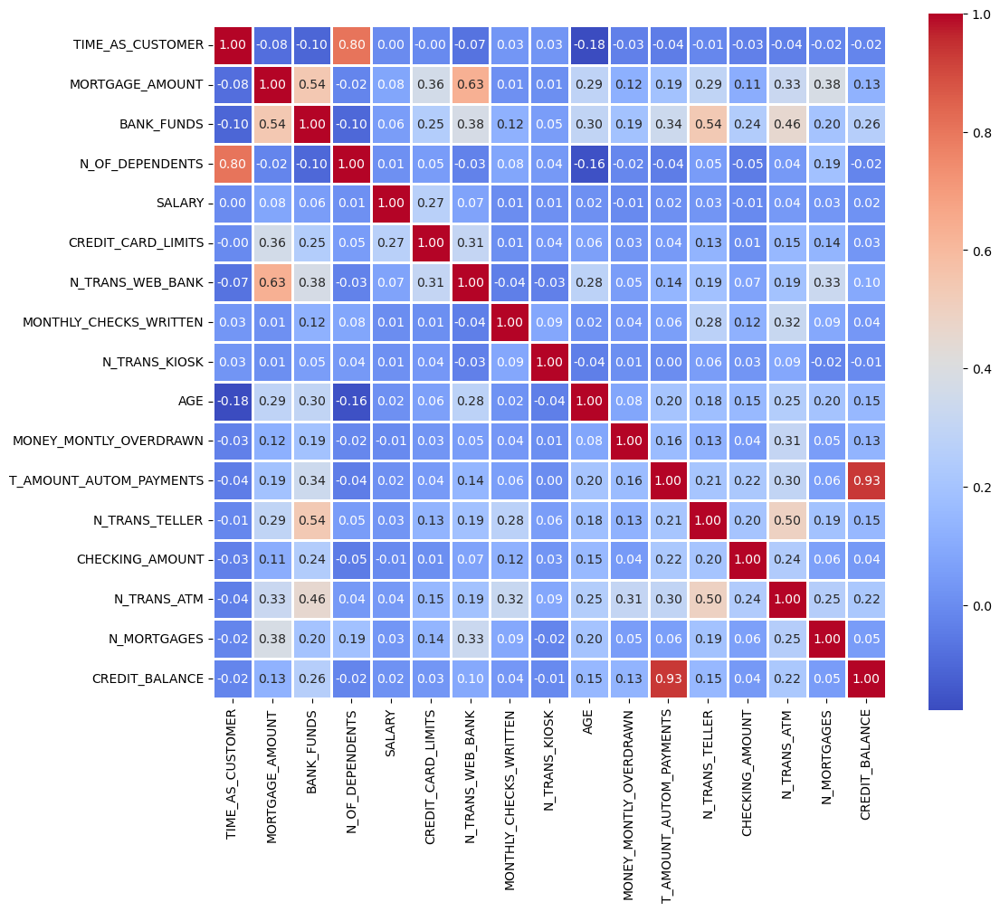

In [30]:
corr_matrix = train_df[quants].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.8, square=True)

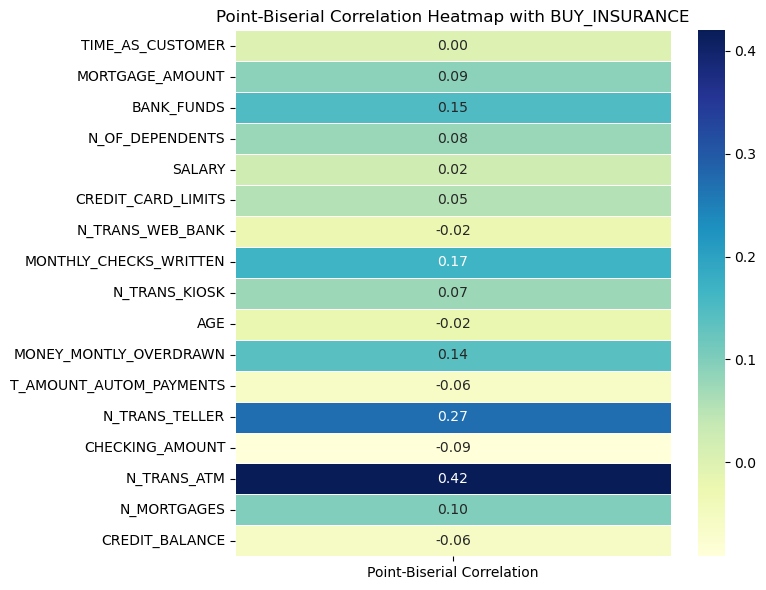

In [31]:
import pandas as pd
from scipy.stats import pointbiserialr

train_df['BUY_INSURANCE'] = train_df['BUY_INSURANCE'].apply(lambda x: 1 if x == 'Yes' else 0)

correlations = {}
for predictor in quants:
    correlation, _ = pointbiserialr(train_df[predictor], train_df['BUY_INSURANCE'])
    correlations[predictor] = correlation

corr_df = pd.DataFrame(correlations.values(), index=correlations.keys(), columns=['Point-Biserial Correlation'])

plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5)
plt.title('Point-Biserial Correlation Heatmap with BUY_INSURANCE')
plt.tight_layout()
plt.show()

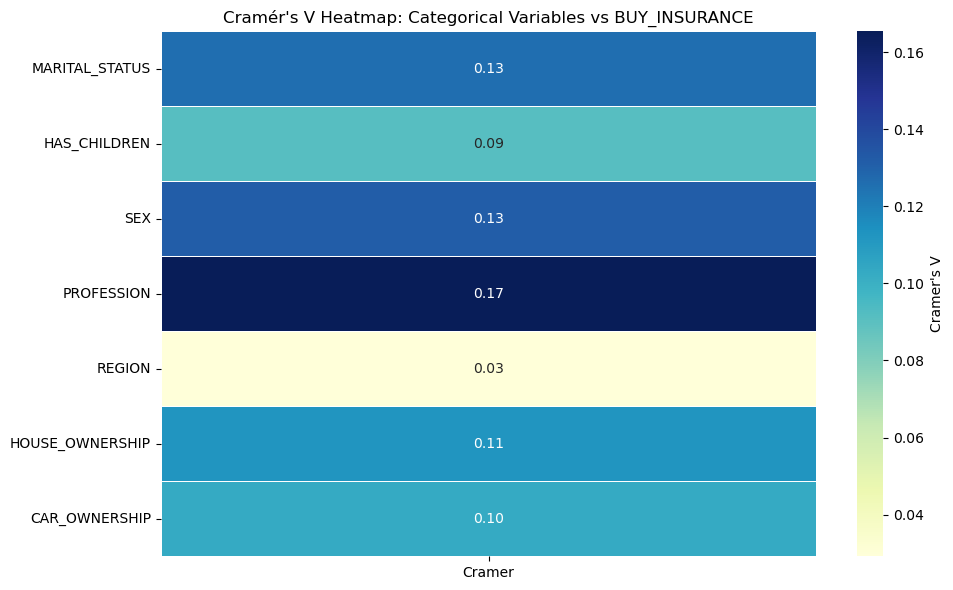

In [32]:
from scipy.stats import chi2_contingency

def cramers_v(chi2, n, k):
    return np.sqrt(chi2 / (n * (k - 1)))

cramers_v_matrix = pd.DataFrame(index=cats, columns=['Cramer'])

for var in cats:
    contingency_table = pd.crosstab(train_df[var], train_df['BUY_INSURANCE'])
    chi2_stat, _, _, _ = chi2_contingency(contingency_table)
    n = contingency_table.sum().sum()
    k = min(contingency_table.shape)
    cramers_v_value = cramers_v(chi2_stat, n, k)
    cramers_v_matrix.loc[var, 'Cramer'] = cramers_v_value

cramers_v_matrix = cramers_v_matrix.apply(pd.to_numeric, errors='coerce')

plt.figure(figsize=(10, 6))
sns.heatmap(cramers_v_matrix, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5, cbar_kws={'label': "Cramer's V"})
plt.title('Cramér\'s V Heatmap: Categorical Variables vs BUY_INSURANCE')
plt.tight_layout()
plt.show()

In [33]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

NameError: name 'labels' is not defined

# Model fitting

In [34]:
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_curve, f1_score, recall_score, precision_score, ConfusionMatrixDisplay

from sklearn.metrics import roc_auc_score


import warnings
warnings.filterwarnings('ignore')

In [35]:
y_test=y_test.map({'Yes':1,'No':0})
test_df = pd.concat([X_test, y_test], axis=1)

In [36]:
test_df.shape,train_df.shape

((2760, 25), (11037, 25))

In [37]:
#train test split
X_train=train_df.drop(columns=['BUY_INSURANCE'])
y_train=train_df['BUY_INSURANCE']
X_test=test_df.drop(columns=['BUY_INSURANCE'])
y_test=test_df['BUY_INSURANCE']

In [38]:
#scaling adn encodeing
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
cats=['MARITAL_STATUS','HAS_CHILDREN','SEX', 'PROFESSION','REGION',
       'HOUSE_OWNERSHIP', 'CAR_OWNERSHIP']
quants=['TIME_AS_CUSTOMER','MORTGAGE_AMOUNT', 'BANK_FUNDS', 'N_OF_DEPENDENTS', 'SALARY',
        'CREDIT_CARD_LIMITS', 'N_TRANS_WEB_BANK', 'MONTHLY_CHECKS_WRITTEN',
       'N_TRANS_KIOSK', 'AGE', 'MONEY_MONTLY_OVERDRAWN','T_AMOUNT_AUTOM_PAYMENTS', 'N_TRANS_TELLER', 'CHECKING_AMOUNT',
       'N_TRANS_ATM', 'N_MORTGAGES','CREDIT_BALANCE']

preprocessor = ColumnTransformer(
    transformers=[
        ('noms',OneHotEncoder(drop='first'),cats),
        ('quants',StandardScaler(),quants)
    ]
)

preprocessor_pipeline = Pipeline(
    [
        ('preprocessor',preprocessor),
    ]
)

## Without Smote

### Logistic Regression (Base  Model)

In [39]:
model_pipline = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',LogisticRegression())
    ]
)

model_pipline.fit(X_train,y_train)

y_preds = model_pipline.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")


              precision    recall  f1-score   support

           0       0.85      0.92      0.88      2004
           1       0.72      0.56      0.63       756

    accuracy                           0.82      2760
   macro avg       0.78      0.74      0.76      2760
weighted avg       0.81      0.82      0.81      2760

AUC-ROC Score: 0.7822


In [40]:
#training accuracy
y_preds_train = model_pipline.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.85      0.91      0.88      8061
           1       0.69      0.56      0.62      2976

    accuracy                           0.81     11037
   macro avg       0.77      0.73      0.75     11037
weighted avg       0.80      0.81      0.81     11037



Text(0.5, 0, 'Predicted Label')

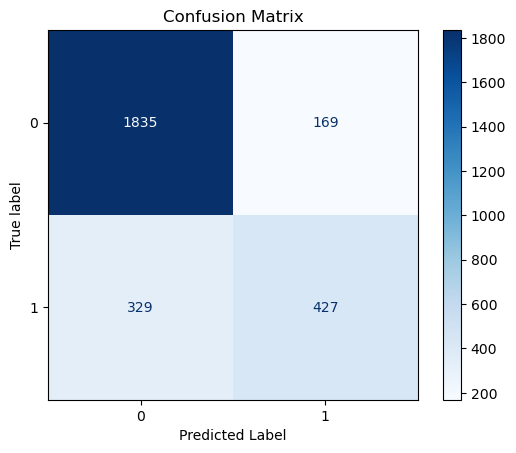

In [41]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Standard Bagging

In [42]:
from sklearn.ensemble import BaggingClassifier
model_pipline2 = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',BaggingClassifier(random_state=123))
    ]
)

model_pipline2.fit(X_train,y_train)

y_preds = model_pipline2.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.88      0.93      0.90      2004
           1       0.78      0.65      0.71       756

    accuracy                           0.85      2760
   macro avg       0.83      0.79      0.81      2760
weighted avg       0.85      0.85      0.85      2760

AUC-ROC Score: 0.8268


In [43]:
#training accuracy
y_preds_train = model_pipline2.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      8061
           1       1.00      0.96      0.98      2976

    accuracy                           0.99     11037
   macro avg       0.99      0.98      0.99     11037
weighted avg       0.99      0.99      0.99     11037



Text(0.5, 0, 'Predicted Label')

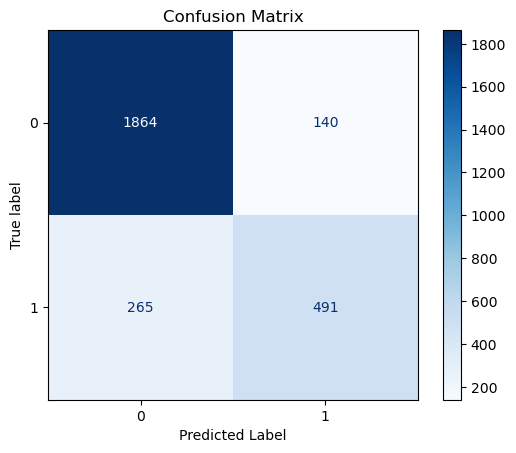

In [44]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Random Forest

In [45]:
from sklearn.ensemble import RandomForestClassifier
model_pipline2 = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',RandomForestClassifier(random_state=123))
    ]
)

model_pipline2.fit(X_train,y_train)

y_preds = model_pipline2.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.88      0.94      0.91      2004
           1       0.80      0.65      0.72       756

    accuracy                           0.86      2760
   macro avg       0.84      0.80      0.81      2760
weighted avg       0.86      0.86      0.86      2760

AUC-ROC Score: 0.8405


In [46]:
#training accuracy
y_preds_train = model_pipline2.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8061
           1       1.00      1.00      1.00      2976

    accuracy                           1.00     11037
   macro avg       1.00      1.00      1.00     11037
weighted avg       1.00      1.00      1.00     11037



Text(0.5, 0, 'Predicted Label')

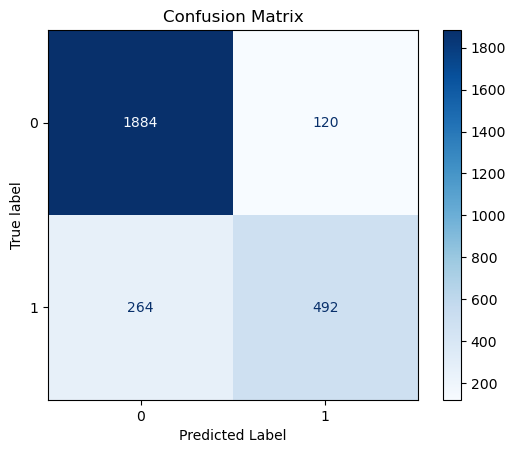

In [47]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### Hyper parameter tunning

In [48]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'model__n_estimators': [50,100,200],
    'model__max_depth': [None,20, 30],
    'model__min_samples_split': [2, 5, 10],
    'model__min_samples_leaf': [1, 2, 3]
}

grid_search1 = GridSearchCV(model_pipline2,
                           param_grid=param_grid, n_jobs=-1)
rf_tuned1=grid_search1.fit(X_train,y_train)
print(grid_search1.best_estimator_)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('noms',
                                                  OneHotEncoder(drop='first'),
                                                  ['MARITAL_STATUS',
                                                   'HAS_CHILDREN', 'SEX',
                                                   'PROFESSION', 'REGION',
                                                   'HOUSE_OWNERSHIP',
                                                   'CAR_OWNERSHIP']),
                                                 ('quants', StandardScaler(),
                                                  ['TIME_AS_CUSTOMER',
                                                   'MORTGAGE_AMOUNT',
                                                   'BANK_FUNDS',
                                                   'N_OF_DEPENDENTS', 'SALARY',
                                                   'CREDIT_CARD_LIMITS',
                                   

In [49]:
y_preds_rf_tn = rf_tuned1.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_rf_tn))
auc_score_rf_tn = roc_auc_score(y_preds_rf_tn,y_test)
print(f"AUC-ROC Score: {auc_score_rf_tn:.4f}")

              precision    recall  f1-score   support

           0       0.88      0.94      0.91      2004
           1       0.80      0.66      0.72       756

    accuracy                           0.86      2760
   macro avg       0.84      0.80      0.82      2760
weighted avg       0.86      0.86      0.86      2760

AUC-ROC Score: 0.8410


In [50]:
#training accuracy
y_preds_train_rf_tn = rf_tuned1.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_rf_tn))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      8061
           1       0.95      0.87      0.91      2976

    accuracy                           0.95     11037
   macro avg       0.95      0.93      0.94     11037
weighted avg       0.95      0.95      0.95     11037



Text(0.5, 0, 'Predicted Label')

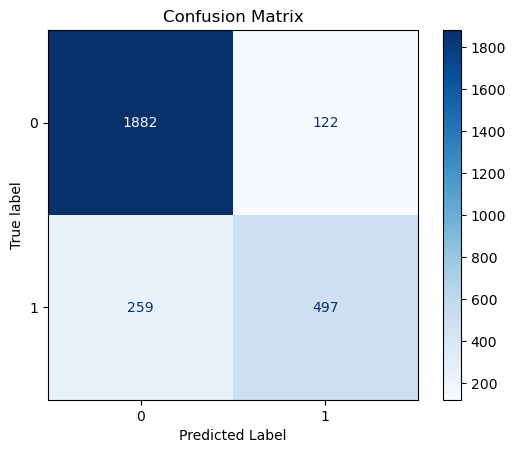

In [51]:
cm_rf_tn = confusion_matrix(y_test, y_preds_rf_tn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_rf_tn)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Ada Boosting

In [52]:
from sklearn.ensemble import AdaBoostClassifier
model_pipline3 = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',AdaBoostClassifier(random_state=123))
    ]
)

model_pipline3.fit(X_train,y_train)

y_preds = model_pipline3.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.90      0.90      0.90      2004
           1       0.74      0.72      0.73       756

    accuracy                           0.85      2760
   macro avg       0.82      0.81      0.81      2760
weighted avg       0.85      0.85      0.85      2760

AUC-ROC Score: 0.8162


In [53]:
#training accuracy
y_preds_train = model_pipline3.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.90      0.90      0.90      8061
           1       0.73      0.73      0.73      2976

    accuracy                           0.85     11037
   macro avg       0.81      0.81      0.81     11037
weighted avg       0.85      0.85      0.85     11037



Text(0.5, 0, 'Predicted Label')

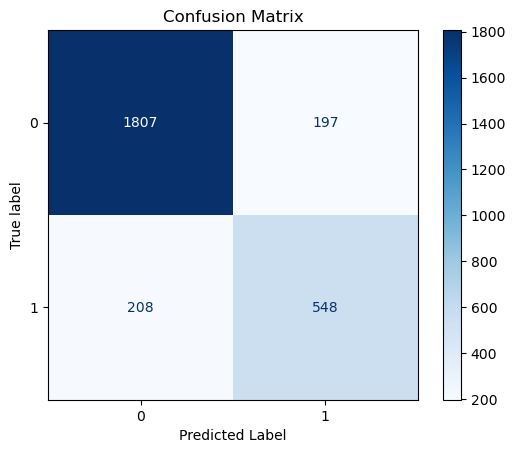

In [54]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### XGB

In [57]:
from xgboost import XGBClassifier
model_pipline4 = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',XGBClassifier(random_state=123))
    ]
)

model_pipline4.fit(X_train,y_train)

y_preds = model_pipline4.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.89      0.92      0.91      2004
           1       0.77      0.71      0.74       756

    accuracy                           0.86      2760
   macro avg       0.83      0.82      0.82      2760
weighted avg       0.86      0.86      0.86      2760

AUC-ROC Score: 0.8337


In [58]:
#training accuracy
y_preds_train = model_pipline4.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      8061
           1       0.95      0.96      0.95      2976

    accuracy                           0.97     11037
   macro avg       0.97      0.97      0.97     11037
weighted avg       0.97      0.97      0.97     11037



Text(0.5, 0, 'Predicted Label')

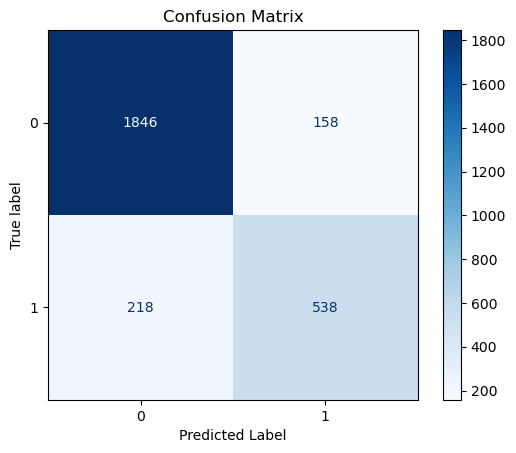

In [59]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### HP tune

In [60]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [3, 6, 9],
    'model__learning_rate': [0.01, 0.1, 0.2],
    'model__subsample': [0.8, 0.9, 1.0],
    'model__colsample_bytree': [0.8, 0.9, 1.0]
}

grid_search2 = GridSearchCV(estimator=model_pipline4,
                           param_grid=param_grid,
                           cv=5,  
                           n_jobs=-1,  
                           verbose=1)  

grid_search2.fit(X_train, y_train)
print(f"Best Parameters: {grid_search2.best_params_}")

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best Parameters: {'model__colsample_bytree': 0.8, 'model__learning_rate': 0.01, 'model__max_depth': 9, 'model__n_estimators': 300, 'model__subsample': 0.8}


In [61]:
y_preds_rf_tn = grid_search2.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_rf_tn))
auc_score_rf_tn = roc_auc_score(y_preds_rf_tn,y_test)
print(f"AUC-ROC Score: {auc_score_rf_tn:.4f}")

              precision    recall  f1-score   support

           0       0.89      0.94      0.91      2004
           1       0.81      0.70      0.75       756

    accuracy                           0.87      2760
   macro avg       0.85      0.82      0.83      2760
weighted avg       0.87      0.87      0.87      2760

AUC-ROC Score: 0.8482


In [62]:
#training accuracy
y_preds_train_rf_tn = grid_search2.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_rf_tn))

              precision    recall  f1-score   support

           0       0.93      0.96      0.94      8061
           1       0.87      0.80      0.84      2976

    accuracy                           0.92     11037
   macro avg       0.90      0.88      0.89     11037
weighted avg       0.91      0.92      0.91     11037



Text(0.5, 0, 'Predicted Label')

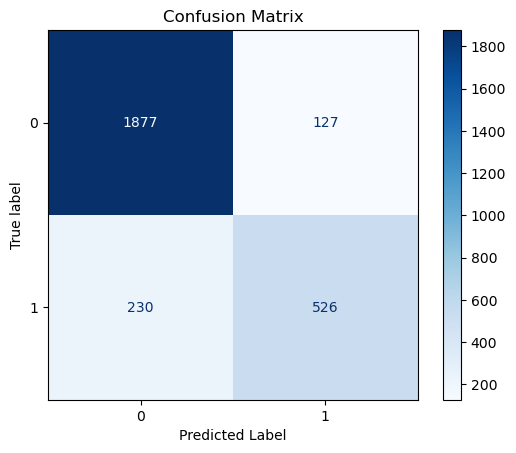

In [63]:
cm = confusion_matrix(y_test, y_preds_rf_tn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### SVM

In [64]:
from sklearn.svm import SVC
model_pipline5 = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',SVC(random_state=123))
    ]
)

model_pipline5.fit(X_train,y_train)

y_preds = model_pipline5.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.86      0.92      0.89      2004
           1       0.73      0.59      0.66       756

    accuracy                           0.83      2760
   macro avg       0.80      0.76      0.77      2760
weighted avg       0.82      0.83      0.82      2760

AUC-ROC Score: 0.7954


In [65]:
#training accuracy
y_preds_train = model_pipline5.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.87      0.94      0.90      8061
           1       0.79      0.63      0.70      2976

    accuracy                           0.85     11037
   macro avg       0.83      0.78      0.80     11037
weighted avg       0.85      0.85      0.85     11037



Text(0.5, 0, 'Predicted Label')

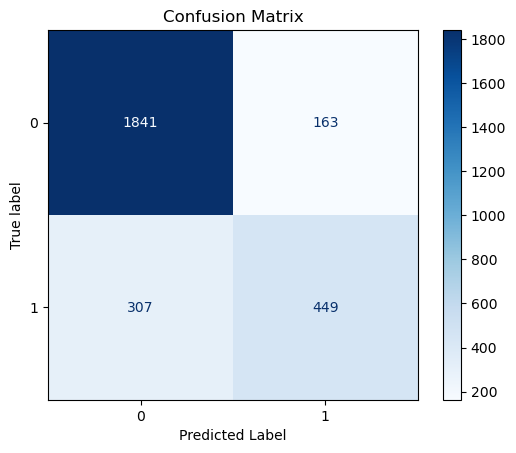

In [66]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

In [67]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'model__C': [0.01, 0.1, 1, 10, 100],
    'model__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'model__degree': [2, 3, 4]
}

grid_search5= GridSearchCV(model_pipline4,
                           param_grid=param_grid,n_jobs=-1)
svm_tuned1=grid_search5.fit(X_train,y_train)
print(grid_search5.best_estimator_)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('noms',
                                                  OneHotEncoder(drop='first'),
                                                  ['MARITAL_STATUS',
                                                   'HAS_CHILDREN', 'SEX',
                                                   'PROFESSION', 'REGION',
                                                   'HOUSE_OWNERSHIP',
                                                   'CAR_OWNERSHIP']),
                                                 ('quants', StandardScaler(),
                                                  ['TIME_AS_CUSTOMER',
                                                   'MORTGAGE_AMOUNT',
                                                   'BANK_FUNDS',
                                                   'N_OF_DEPENDENTS', 'SALARY',
                                                   'CREDIT_CARD_LIMITS',
                                   

In [68]:
y_preds_svm_tn = svm_tuned1.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_svm_tn))
auc_score_svm_tn = roc_auc_score(y_preds_svm_tn,y_test)
print(f"AUC-ROC Score: {auc_score_svm_tn:.4f}")

              precision    recall  f1-score   support

           0       0.89      0.92      0.91      2004
           1       0.77      0.71      0.74       756

    accuracy                           0.86      2760
   macro avg       0.83      0.82      0.82      2760
weighted avg       0.86      0.86      0.86      2760

AUC-ROC Score: 0.8337


In [69]:
#training accuracy
y_preds_train_svm_tn = svm_tuned1.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train_svm_tn))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98      8061
           1       0.95      0.96      0.95      2976

    accuracy                           0.97     11037
   macro avg       0.97      0.97      0.97     11037
weighted avg       0.97      0.97      0.97     11037



### KNN

In [70]:
from sklearn.neighbors import KNeighborsClassifier
model_pipline6 = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',KNeighborsClassifier(n_neighbors=2))
    ]
)

model_pipline6.fit(X_train,y_train)

y_preds = model_pipline6.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.78      0.93      0.85      2004
           1       0.64      0.31      0.42       756

    accuracy                           0.76      2760
   macro avg       0.71      0.62      0.64      2760
weighted avg       0.74      0.76      0.73      2760

AUC-ROC Score: 0.7113


In [71]:
#training accuracy
y_preds_train = model_pipline6.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.85      1.00      0.92      8061
           1       1.00      0.54      0.70      2976

    accuracy                           0.88     11037
   macro avg       0.93      0.77      0.81     11037
weighted avg       0.89      0.88      0.86     11037



Text(0.5, 0, 'Predicted Label')

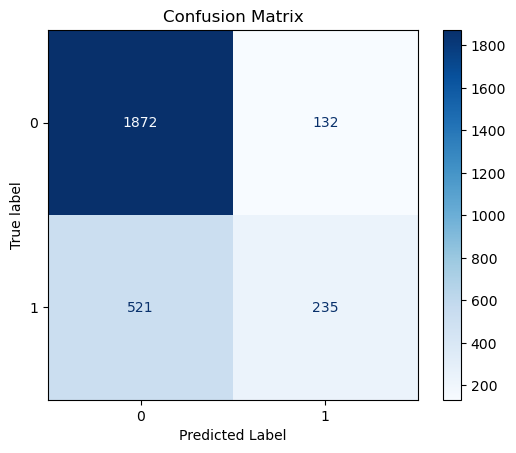

In [72]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Naive Bayes

In [73]:
from sklearn.naive_bayes import BernoulliNB
model_pipline7 = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('model',BernoulliNB())
    ]
)

model_pipline7.fit(X_train,y_train)

y_preds = model_pipline7.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.86      0.80      0.83      2004
           1       0.55      0.65      0.59       756

    accuracy                           0.76      2760
   macro avg       0.70      0.72      0.71      2760
weighted avg       0.77      0.76      0.76      2760

AUC-ROC Score: 0.7031


In [74]:
#training accuracy
y_preds_train = model_pipline7.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.85      0.79      0.82      8061
           1       0.52      0.63      0.57      2976

    accuracy                           0.75     11037
   macro avg       0.69      0.71      0.70     11037
weighted avg       0.76      0.75      0.75     11037



Text(0.5, 0, 'Predicted Label')

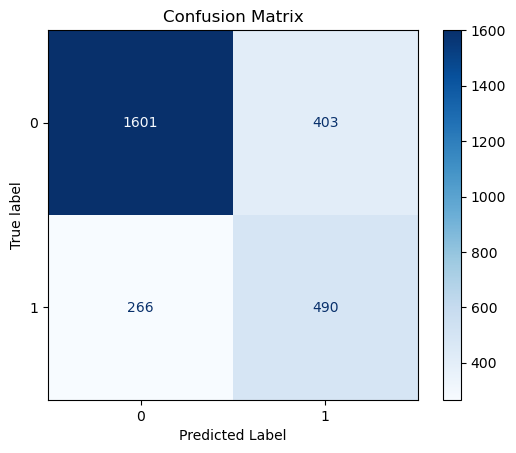

In [75]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

## With resampling (SMOTE)

In [76]:
from imblearn.pipeline import Pipeline 
smote = SMOTE(sampling_strategy=1, random_state=123)

### Logistic base model

In [77]:
model_pipline_sm = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('smote', smote),
       ('model',LogisticRegression())
    ]
)

model_pipline_sm.fit(X_train,y_train)

y_preds = model_pipline_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.92      0.75      0.82      2004
           1       0.55      0.82      0.66       756

    accuracy                           0.77      2760
   macro avg       0.73      0.78      0.74      2760
weighted avg       0.81      0.77      0.78      2760

AUC-ROC Score: 0.7323


In [78]:
#training accuracy
y_preds_train = model_pipline_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.91      0.74      0.82      8061
           1       0.54      0.81      0.65      2976

    accuracy                           0.76     11037
   macro avg       0.72      0.78      0.73     11037
weighted avg       0.81      0.76      0.77     11037



Text(0.5, 0, 'Predicted Label')

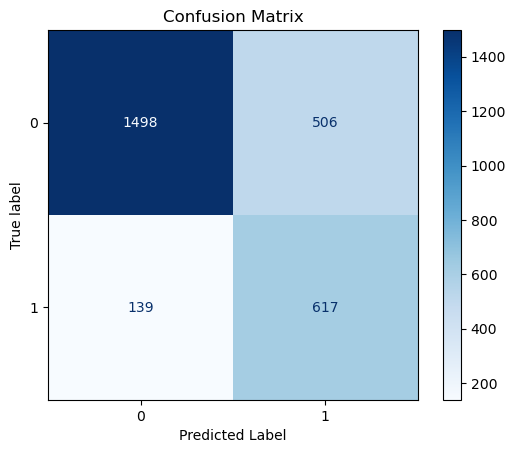

In [79]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Standard bagging

In [80]:
from sklearn.ensemble import BaggingClassifier
model_pipline1_sm = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('smote', smote),
       ('model',BaggingClassifier(random_state=123))
    ]
)

model_pipline1_sm.fit(X_train,y_train)

y_preds = model_pipline1_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.88      0.91      0.90      2004
           1       0.74      0.68      0.71       756

    accuracy                           0.85      2760
   macro avg       0.81      0.80      0.80      2760
weighted avg       0.84      0.85      0.85      2760

AUC-ROC Score: 0.8113


In [81]:
#training accuracy
y_preds_train = model_pipline1_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      8061
           1       0.99      0.98      0.99      2976

    accuracy                           0.99     11037
   macro avg       0.99      0.99      0.99     11037
weighted avg       0.99      0.99      0.99     11037



Text(0.5, 0, 'Predicted Label')

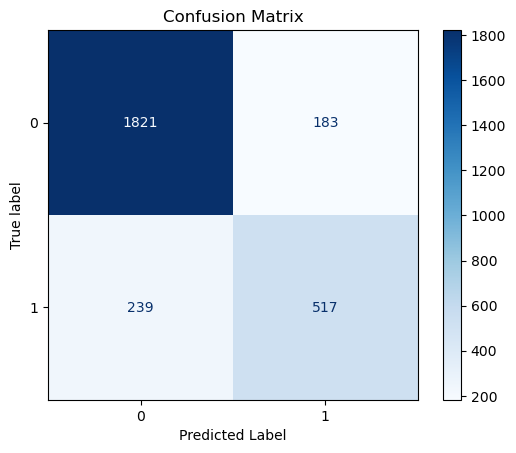

In [82]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Random forest


In [83]:
from sklearn.ensemble import RandomForestClassifier
model_pipline2_sm = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('smote', smote),
       ('model',RandomForestClassifier(random_state=123))
    ]
)

model_pipline2_sm.fit(X_train,y_train)

y_preds = model_pipline2_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.89      0.90      0.90      2004
           1       0.74      0.72      0.73       756

    accuracy                           0.85      2760
   macro avg       0.82      0.81      0.81      2760
weighted avg       0.85      0.85      0.85      2760

AUC-ROC Score: 0.8165


In [84]:
#training accuracy
y_preds_train = model_pipline2_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8061
           1       1.00      1.00      1.00      2976

    accuracy                           1.00     11037
   macro avg       1.00      1.00      1.00     11037
weighted avg       1.00      1.00      1.00     11037



Text(0.5, 0, 'Predicted Label')

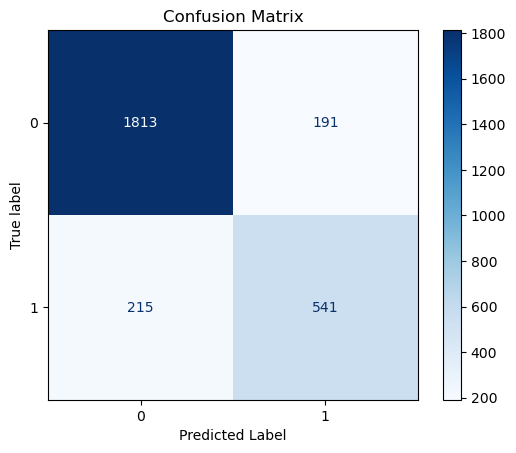

In [85]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### hp tune

In [86]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'smote__sampling_strategy': [0.5, 1.0, 'minority'],
    'model__n_estimators': [100, 200, 300, 400, 500],
    'model__max_depth': [10, 20, 30, None],
    'model__min_samples_split': [2, 5, 10],
    'model__min_samples_leaf': [1, 2, 4],
   
}

grid_search1_sm = GridSearchCV(model_pipline2_sm,
                           param_grid=param_grid, n_jobs=-1)
rf_tuned1_sm=grid_search1_sm.fit(X_train,y_train)
print(grid_search1_sm.best_estimator_)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('noms',
                                                  OneHotEncoder(drop='first'),
                                                  ['MARITAL_STATUS',
                                                   'HAS_CHILDREN', 'SEX',
                                                   'PROFESSION', 'REGION',
                                                   'HOUSE_OWNERSHIP',
                                                   'CAR_OWNERSHIP']),
                                                 ('quants', StandardScaler(),
                                                  ['TIME_AS_CUSTOMER',
                                                   'MORTGAGE_AMOUNT',
                                                   'BANK_FUNDS',
                                                   'N_OF_DEPENDENTS', 'SALARY',
                                                   'CREDIT_CARD_LIMITS',
                                   

In [87]:
y_preds_rf_tn = grid_search1_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_rf_tn))
auc_score_rf_tn = roc_auc_score(y_preds_rf_tn,y_test)
print(f"AUC-ROC Score: {auc_score_rf_tn:.4f}")

y_preds_train = grid_search1_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))


              precision    recall  f1-score   support

           0       0.89      0.93      0.91      2004
           1       0.78      0.69      0.73       756

    accuracy                           0.86      2760
   macro avg       0.83      0.81      0.82      2760
weighted avg       0.86      0.86      0.86      2760

AUC-ROC Score: 0.8343
              precision    recall  f1-score   support

           0       0.94      0.97      0.95      8061
           1       0.90      0.84      0.87      2976

    accuracy                           0.93     11037
   macro avg       0.92      0.90      0.91     11037
weighted avg       0.93      0.93      0.93     11037



Text(0.5, 0, 'Predicted Label')

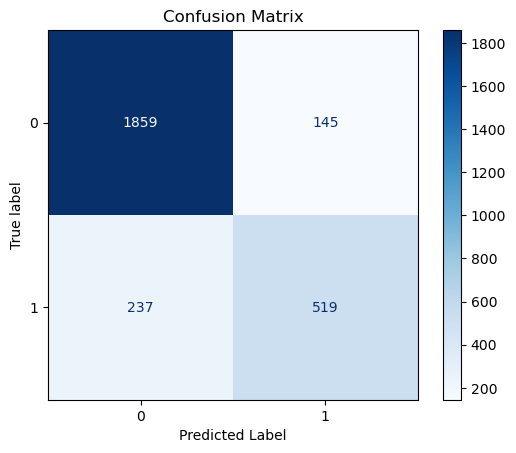

In [88]:
cm = confusion_matrix(y_test, y_preds_rf_tn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Ada Boosts

In [89]:
from sklearn.ensemble import AdaBoostClassifier
model_pipline3_sm = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('smote', smote),
       ('model',AdaBoostClassifier(random_state=123))
    ]
)

model_pipline3_sm.fit(X_train,y_train)

y_preds = model_pipline3_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.92      0.83      0.87      2004
           1       0.64      0.80      0.71       756

    accuracy                           0.82      2760
   macro avg       0.78      0.82      0.79      2760
weighted avg       0.84      0.82      0.83      2760

AUC-ROC Score: 0.7792


In [90]:
#training accuracy
y_preds_train = model_pipline3_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.92      0.83      0.87      8061
           1       0.64      0.80      0.71      2976

    accuracy                           0.82     11037
   macro avg       0.78      0.82      0.79     11037
weighted avg       0.84      0.82      0.83     11037



Text(0.5, 0, 'Predicted Label')

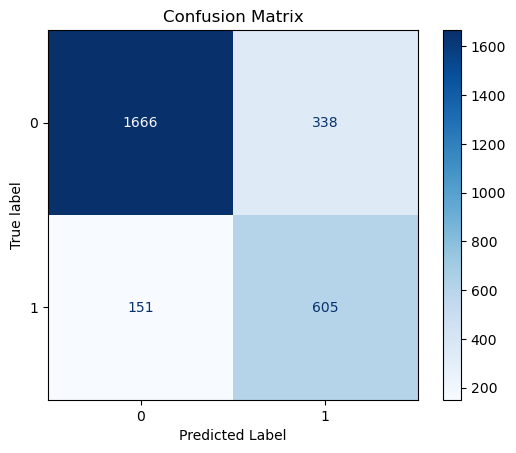

In [91]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### XGB

In [92]:
from xgboost import XGBClassifier
model_pipline4_sm = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('smote', smote),
       ('model',XGBClassifier(random_state=123))
    ]
)

model_pipline4_sm.fit(X_train,y_train)

y_preds = model_pipline4_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      2004
           1       0.76      0.71      0.73       756

    accuracy                           0.86      2760
   macro avg       0.83      0.81      0.82      2760
weighted avg       0.86      0.86      0.86      2760

AUC-ROC Score: 0.8254


In [93]:
#training accuracy
y_preds_train = model_pipline4_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      8061
           1       0.93      0.95      0.94      2976

    accuracy                           0.97     11037
   macro avg       0.96      0.96      0.96     11037
weighted avg       0.97      0.97      0.97     11037



Text(0.5, 0, 'Predicted Label')

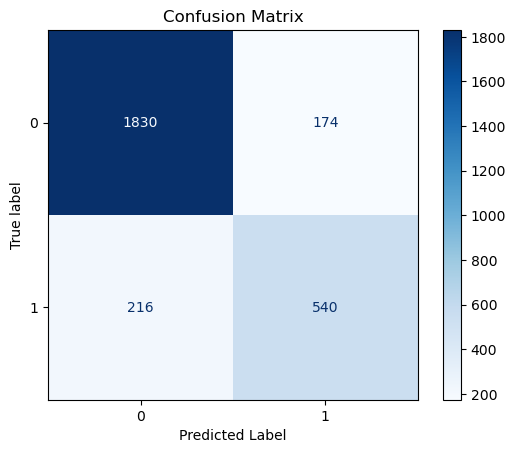

In [94]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

#### hp tune

In [95]:

param_grid = {
    'smote__sampling_strategy': [0.5, 1.0, 'minority'],
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [3, 6, 9],
    'model__learning_rate': [0.01, 0.1, 0.2],
    'model__subsample': [0.8, 0.9, 1.0],
}

grid_search2_sm = GridSearchCV(estimator=model_pipline4_sm,
                           param_grid=param_grid,
                           cv=5,  
                           n_jobs=-1,  
                           verbose=1)  

grid_search2_sm.fit(X_train, y_train)
print(f"Best Parameters: {grid_search2_sm.best_params_}")

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best Parameters: {'model__learning_rate': 0.1, 'model__max_depth': 9, 'model__n_estimators': 100, 'model__subsample': 1.0, 'smote__sampling_strategy': 0.5}


In [96]:
y_preds_rf_tn = grid_search2_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_rf_tn))
auc_score_rf_tn = roc_auc_score(y_preds_rf_tn,y_test)
print(f"AUC-ROC Score: {auc_score_rf_tn:.4f}")

y_preds_train = grid_search2_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.90      0.92      0.91      2004
           1       0.78      0.72      0.75       756

    accuracy                           0.87      2760
   macro avg       0.84      0.82      0.83      2760
weighted avg       0.86      0.87      0.86      2760

AUC-ROC Score: 0.8373
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      8061
           1       0.94      0.95      0.95      2976

    accuracy                           0.97     11037
   macro avg       0.96      0.97      0.96     11037
weighted avg       0.97      0.97      0.97     11037



Text(0.5, 0, 'Predicted Label')

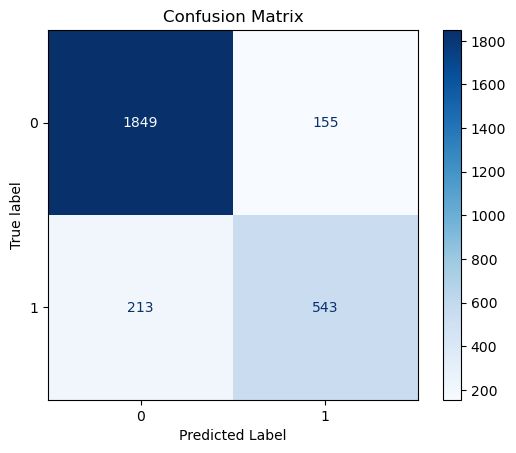

In [97]:
cm = confusion_matrix(y_test, y_preds_rf_tn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### SVM

In [98]:
from sklearn.svm import SVC
model_pipline5_sm = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('smote', smote),
       ('model',SVC(random_state=123))
    ]
)

model_pipline5_sm.fit(X_train,y_train)

y_preds = model_pipline5_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.92      0.79      0.85      2004
           1       0.60      0.83      0.70       756

    accuracy                           0.80      2760
   macro avg       0.76      0.81      0.77      2760
weighted avg       0.84      0.80      0.81      2760

AUC-ROC Score: 0.7625


In [99]:
#training accuracy
y_preds_train = model_pipline5_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.95      0.80      0.87      8061
           1       0.62      0.90      0.73      2976

    accuracy                           0.83     11037
   macro avg       0.79      0.85      0.80     11037
weighted avg       0.86      0.83      0.83     11037



Text(0.5, 0, 'Predicted Label')

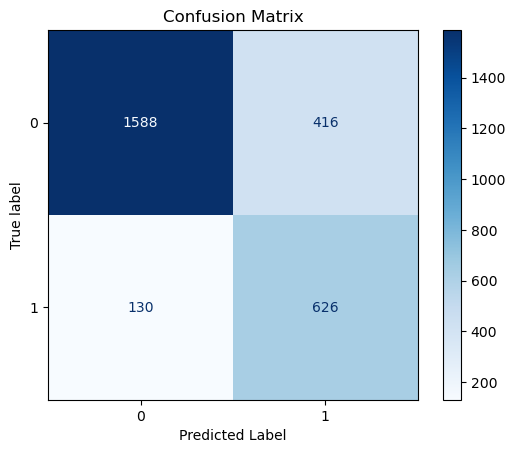

In [100]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### KNN

In [101]:
from sklearn.neighbors import KNeighborsClassifier
model_pipline6_sm = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('smote', smote),
       ('model',KNeighborsClassifier(n_neighbors=2))
    ]
)

model_pipline6_sm.fit(X_train,y_train)

y_preds = model_pipline6_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.82      0.82      0.82      2004
           1       0.53      0.53      0.53       756

    accuracy                           0.74      2760
   macro avg       0.68      0.68      0.68      2760
weighted avg       0.74      0.74      0.74      2760

AUC-ROC Score: 0.6756


In [102]:
#training accuracy
y_preds_train = model_pipline6_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      8061
           1       1.00      0.95      0.97      2976

    accuracy                           0.99     11037
   macro avg       0.99      0.97      0.98     11037
weighted avg       0.99      0.99      0.99     11037



Text(0.5, 0, 'Predicted Label')

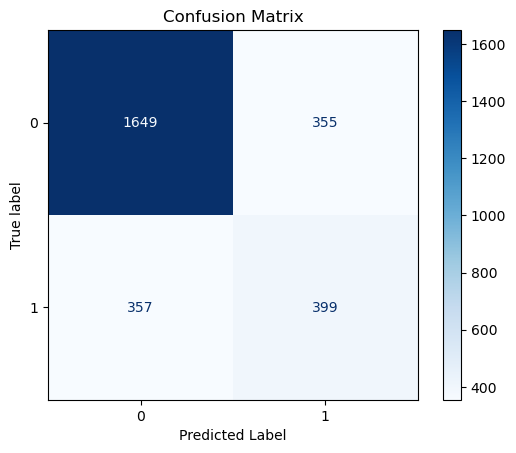

In [103]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

### Naive bayes

In [104]:
from sklearn.naive_bayes import BernoulliNB
model_pipline7_sm = Pipeline(
    [
       ('preprocessor',preprocessor),
       ('smote', smote),
       ('model',BernoulliNB())
    ]
)

model_pipline7_sm.fit(X_train,y_train)

y_preds = model_pipline7_sm.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.89      0.69      0.78      2004
           1       0.49      0.77      0.60       756

    accuracy                           0.71      2760
   macro avg       0.69      0.73      0.69      2760
weighted avg       0.78      0.71      0.73      2760

AUC-ROC Score: 0.6872


In [105]:
#training accuracy
y_preds_train = model_pipline7_sm.predict(X_train)
print(classification_report(y_true=y_train,y_pred=y_preds_train))

              precision    recall  f1-score   support

           0       0.88      0.69      0.77      8061
           1       0.47      0.75      0.58      2976

    accuracy                           0.71     11037
   macro avg       0.68      0.72      0.68     11037
weighted avg       0.77      0.71      0.72     11037



Text(0.5, 0, 'Predicted Label')

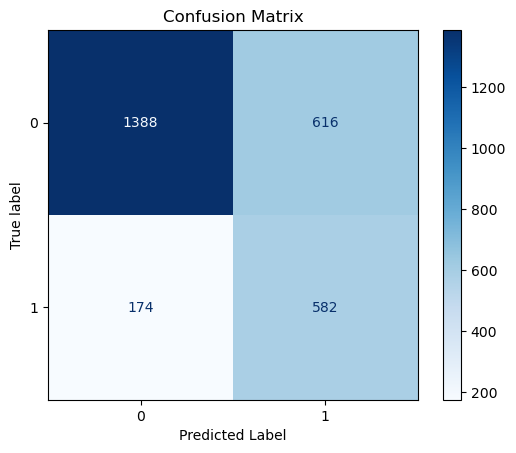

In [106]:
cm = confusion_matrix(y_test, y_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
disp.ax_.set_title('Confusion Matrix')
disp.ax_.set_xlabel('Predicted Label')

## Neural Networks

In [99]:
pip install tensorflow

  Using cached tensorflow-2.17.0-cp312-cp312-win_amd64.whl.metadata (3.2 kB)
  Using cached tensorflow_intel-2.17.0-cp312-cp312-win_amd64.whl.metadata (5.0 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Using cached flatbuffers-24.3.25-py2.py3-none-any.whl.metadata (850 bytes)
  Using cached gast-0.6.0-py3-none-any.whl.metadata (1.3 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl.metadata (814 bytes)
  Using cached libclang-18.1.1-py2.py3-none-win_amd64.whl.metadata (5.3 kB)
  Using cached ml_dtypes-0.4.1-cp312-cp312-win_amd64.whl.metadata (20 kB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl.metadata (6.5 kB)
  Using cached termcolor-2.4.0-py3-none-any.whl.metadata (6.1 kB)
  Using cached grpcio-1.66.1-cp312-cp312-win_amd64.whl.metadata (4.0 kB)
  Using cached tensorboard-2.17.1-py3-none-any.whl.metadata (1.6 kB)
  Using cached tensorboard_data_server-0.7.2-py3-none-any.whl.metadata (1.1 kB)
Using cached tensorflow-2.17.0-cp312-cp312-win_amd64.w

In [101]:
from sklearn.compose import ColumnTransformer
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping

In [103]:
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

In [105]:
model = Sequential()
model.add(Dense(32, activation='relu', input_shape=(X_train_processed.shape[1],))) 
model.add(Dense(16, activation='relu')) 
model.add(Dense(1, activation='sigmoid'))

In [107]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [109]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5)

In [111]:
history = model.fit(X_train_processed, y_train, 
                    validation_split=0.2, 
                    epochs=50, 
                    batch_size=32, 
                    callbacks=[early_stopping], 
                    verbose=1)

Epoch 1/50
276/276 ━━━━━━━━━━━━━━━━━━━━ 1s 945us/step - accuracy: 0.7617 - loss: 0.4776 - val_accuracy: 0.7953 - val_loss: 0.4170
Epoch 2/50
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 550us/step - accuracy: 0.8180 - loss: 0.3935 - val_accuracy: 0.7957 - val_loss: 0.4060
Epoch 3/50
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 525us/step - accuracy: 0.8312 - loss: 0.3787 - val_accuracy: 0.8066 - val_loss: 0.3977
Epoch 4/50
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 582us/step - accuracy: 0.8281 - loss: 0.3675 - val_accuracy: 0.8130 - val_loss: 0.3856
Epoch 5/50
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 554us/step - accuracy: 0.8349 - loss: 0.3548 - val_accuracy: 0.8084 - val_loss: 0.3773
Epoch 6/50
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 543us/step - accuracy: 0.8341 - loss: 0.3493 - val_accuracy: 0.8102 - val_loss: 0.3715
Epoch 7/50
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 550us/step - accuracy: 0.8394 - loss: 0.3422 - val_accuracy: 0.8216 - val_loss: 0.3785
Epoch 8/50
276/276 ━━━━━━━━━━━━━━━━━━━━ 0s 541us/step - accuracy: 0.8435 - loss: 0.3361 - 

In [113]:
y_preds = (model.predict(X_test_processed) > 0.5).astype("int32")

87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 618us/step


In [115]:
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.88      0.91      0.90      2004
           1       0.74      0.68      0.71       756

    accuracy                           0.85      2760
   macro avg       0.81      0.79      0.80      2760
weighted avg       0.84      0.85      0.84      2760

AUC-ROC Score: 0.8117


In [117]:
y_preds_train = (model.predict(X_train_processed) > 0.5).astype("int32")
print(classification_report(y_true=y_train,y_pred=y_preds_train))

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 322us/step
              precision    recall  f1-score   support

           0       0.89      0.92      0.91      8061
           1       0.76      0.70      0.73      2976

    accuracy                           0.86     11037
   macro avg       0.83      0.81      0.82     11037
weighted avg       0.86      0.86      0.86     11037



## Best Model Performance

According to the overall performance best model is XGB without resampling

In [107]:
best_model=grid_search2

In [108]:
#saving best model
import joblib
joblib.dump(best_model, 'best_model.pkl')

['best_model.pkl']

In [109]:
#import pickle
#with open('best_model.pkl', 'rb') as file:
    #best_model = pickle.load(file)

In [110]:
encoder = preprocessor.named_transformers_['noms']

cat_columns = encoder.get_feature_names_out(cats)

all_columns = list(cat_columns) + quants
print(all_columns)

['MARITAL_STATUS_MARRIED', 'MARITAL_STATUS_OTHER', 'MARITAL_STATUS_SINGLE', 'MARITAL_STATUS_WIDOWED', 'HAS_CHILDREN_1', 'SEX_M', 'PROFESSION_Author', 'PROFESSION_Cashier', 'PROFESSION_Clerical', 'PROFESSION_IT Staff', 'PROFESSION_Not specified', 'PROFESSION_Nurse', 'PROFESSION_Other', 'PROFESSION_Programmer/Developer', 'PROFESSION_Waiter/Waitress', 'REGION_NorthEast', 'REGION_South', 'REGION_Southwest', 'REGION_West', 'HOUSE_OWNERSHIP_1', 'HOUSE_OWNERSHIP_2', 'CAR_OWNERSHIP_1', 'TIME_AS_CUSTOMER', 'MORTGAGE_AMOUNT', 'BANK_FUNDS', 'N_OF_DEPENDENTS', 'SALARY', 'CREDIT_CARD_LIMITS', 'N_TRANS_WEB_BANK', 'MONTHLY_CHECKS_WRITTEN', 'N_TRANS_KIOSK', 'AGE', 'MONEY_MONTLY_OVERDRAWN', 'T_AMOUNT_AUTOM_PAYMENTS', 'N_TRANS_TELLER', 'CHECKING_AMOUNT', 'N_TRANS_ATM', 'N_MORTGAGES', 'CREDIT_BALANCE']


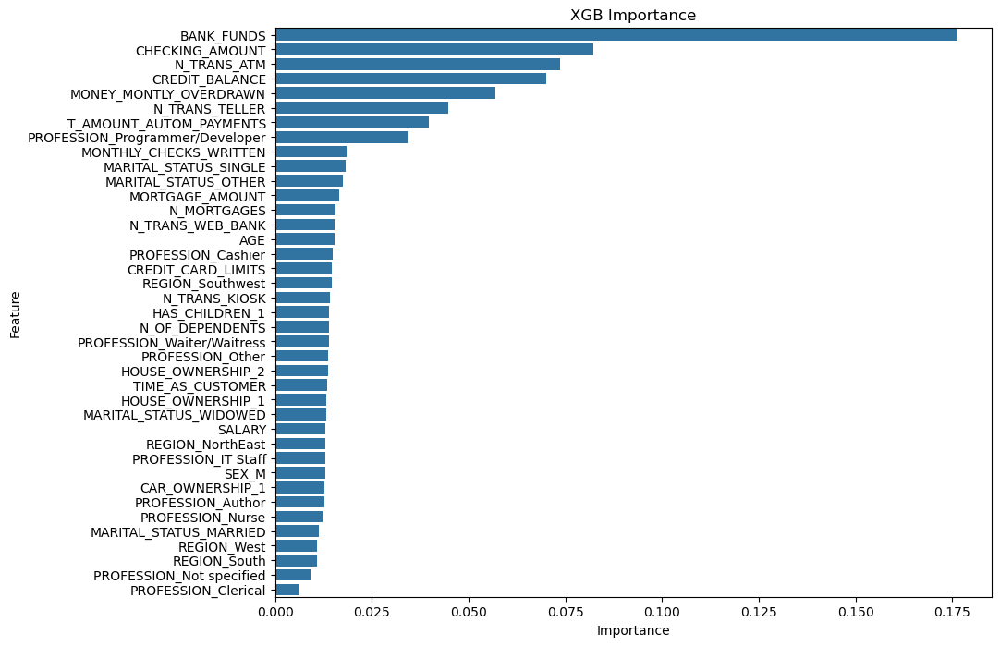

In [111]:
model_pipeline = grid_search2.best_estimator_ 
importances = model_pipeline.named_steps['model'].feature_importances_

feature_importances_df = pd.DataFrame({
    'Feature': all_columns,
    'Importance': importances
})

feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importances_df)
plt.title('XGB Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

SEX, HAS_CHILDEN AND CAR_OVNERSHIP not having and importance so remove those and fit again

In [114]:
#selected categorical and numerical variables
cats_sel=['MARITAL_STATUS', 'PROFESSION','REGION',
       'HOUSE_OWNERSHIP']
quant_sel=['TIME_AS_CUSTOMER','MORTGAGE_AMOUNT', 'BANK_FUNDS', 'N_OF_DEPENDENTS', 'SALARY',
        'CREDIT_CARD_LIMITS', 'N_TRANS_WEB_BANK', 'MONTHLY_CHECKS_WRITTEN',
       'N_TRANS_KIOSK', 'AGE', 'MONEY_MONTLY_OVERDRAWN','T_AMOUNT_AUTOM_PAYMENTS', 'N_TRANS_TELLER', 'CHECKING_AMOUNT',
       'N_TRANS_ATM', 'N_MORTGAGES','CREDIT_BALANCE']

In [115]:

preprocessor1 = ColumnTransformer(
    transformers=[
        ('noms',OneHotEncoder(drop='first'),cats_sel),
        ('quants',StandardScaler(),quant_sel)
    ]
)

preprocessor_pipeline1 = Pipeline(
    [
        ('preprocessor',preprocessor1),
    ]
)

In [116]:
from xgboost import XGBClassifier
model_pipline4_sel = Pipeline(
    [
       ('preprocessor',preprocessor1),
       ('model',XGBClassifier(random_state=123))
    ]
)

model_pipline4_sel .fit(X_train,y_train)

y_preds = model_pipline4_sel .predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds))
auc_score = roc_auc_score(y_preds,y_test)
print(f"AUC-ROC Score: {auc_score:.4f}")

              precision    recall  f1-score   support

           0       0.89      0.92      0.90      2004
           1       0.77      0.70      0.73       756

    accuracy                           0.86      2760
   macro avg       0.83      0.81      0.82      2760
weighted avg       0.86      0.86      0.86      2760

AUC-ROC Score: 0.8287


In [117]:
param_grid = {
    'model__n_estimators': [100, 200, 300],
    'model__max_depth': [3, 6, 9],
    'model__learning_rate': [0.01, 0.1, 0.2],
    'model__subsample': [0.8, 0.9, 1.0],
    'model__colsample_bytree': [0.8, 0.9, 1.0]
}

grid_search2_sel = GridSearchCV(estimator=model_pipline4_sel,
                           param_grid=param_grid,
                           cv=5,  
                           n_jobs=-1,  
                           verbose=1)  

grid_search2_sel.fit(X_train, y_train)
print(f"Best Parameters: {grid_search2_sel.best_params_}")

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best Parameters: {'model__colsample_bytree': 0.9, 'model__learning_rate': 0.01, 'model__max_depth': 9, 'model__n_estimators': 200, 'model__subsample': 0.8}


In [118]:
y_preds_rf_tn = grid_search2_sel.predict(X_test)
print(classification_report(y_true=y_test,y_pred=y_preds_rf_tn))
auc_score_rf_tn = roc_auc_score(y_preds_rf_tn,y_test)
print(f"AUC-ROC Score: {auc_score_rf_tn:.4f}")

              precision    recall  f1-score   support

           0       0.88      0.94      0.91      2004
           1       0.81      0.67      0.74       756

    accuracy                           0.87      2760
   macro avg       0.85      0.81      0.83      2760
weighted avg       0.87      0.87      0.86      2760

AUC-ROC Score: 0.8497


when we remove unimportant variables and run xgb overall accuracy and performance dicreases so, the best model is the system with all variables

we cannot use ROC curve in unbalaced cases

#### shap analysis

In [121]:
!pip install shap

In [122]:
best_model1 = grid_search2.best_estimator_

import shap
preprocessor = best_model1.named_steps['preprocessor']
X_test_preprocessed = preprocessor.transform(X_test)

explainer = shap.Explainer(best_model1.named_steps['model'])
shap_values = explainer(X_test_preprocessed)


In [123]:
def get_feature_names(column_transformer):
    feature_names = []
    
    for name, transformer, columns in column_transformer.transformers_:
        if hasattr(transformer, 'get_feature_names_out'):
            feature_names.extend(transformer.get_feature_names_out(input_features=columns))
        else:
            feature_names.extend(columns)
    
    return feature_names

feature_names = get_feature_names(preprocessor)

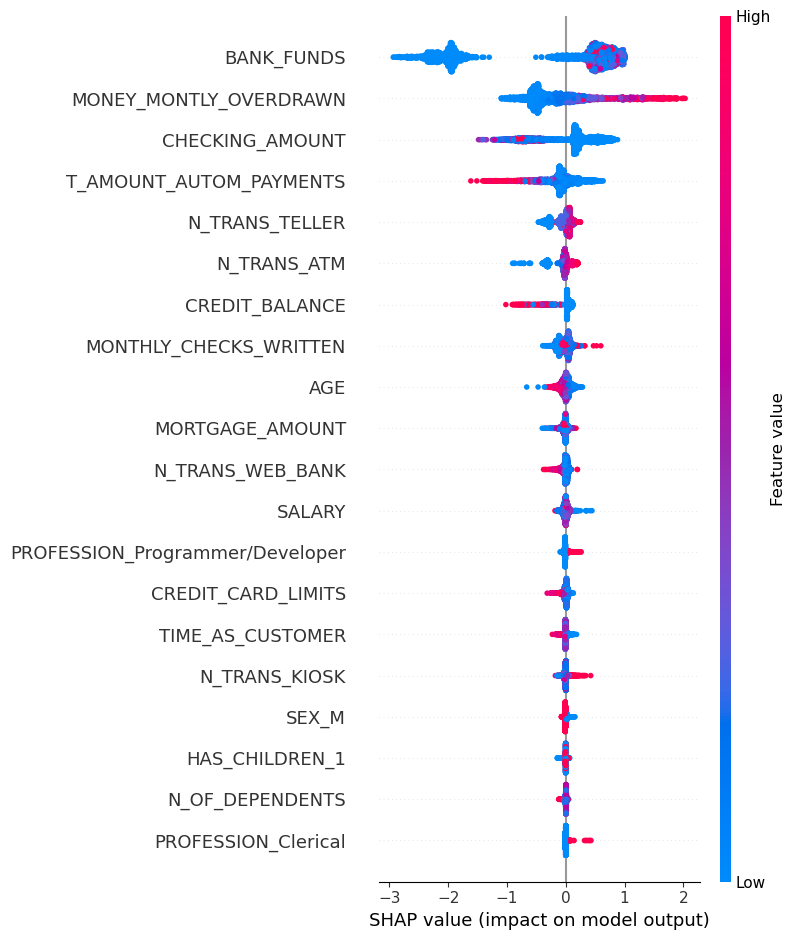

In [124]:
shap.summary_plot(shap_values, X_test_preprocessed, feature_names=feature_names)
